# <font color="darkblue">*Instructor:* `Doctor Rami Al-Ouran`</font>

- **University**: [Al Hussein Technical University (HTU)](https://htu.edu.jo/#/)
- **Email**: rami.alouran@htu.edu.jo
- [**Google Scholar**](https://scholar.google.com/citations?user=2Z5BD8IAAAAJ&hl=en&oi=ao)
- [**LinkedIn**](https://www.linkedin.com/in/rami-al-ouran-68480a15/)


# <font color="darkblue">*Student:* `Sanad Abdelrahman Alawi`</font>

- **University**: [Al Hussein Technical University (HTU)](https://htu.edu.jo/#/)
- **Student ID**: 21110042
- **Course**    : Computing a Research Project (CRP)

#### <font color="darkblue">*Project Title:* `"Pancreatic Cancer Detection Using Machine Learning, Deep Learning, TabPFN, and Explainable AI"`</font>

---


- **Dataset Sources**:  
    - **Original Research Paper**: [Urine biomarkers enable pancreatic cancer detection up to 2 years before diagnosis | International Journal of Cancer](https://onlinelibrary.wiley.com/doi/full/10.1002/ijc.34287)                                               
    - The dataset used in this project was provided as **Supporting Information Table S1** in the supplementary
materials of the paper. It includes raw measurements of three urinary biomarkers (LYVE1, REG1B, and
TFF1), urine creatinine, and plasma CA19-9, along with metadata indicating case/control status and the
number of years before diagnosis.

### *<u>Project Sections</u>*

- **Section 1**: Loading the Data and Analyzing It...

---


### `Section 1` - Loading the Data and Analyzing It...

- 1

In [8]:
# Libraries
# Importing Libraries...
# Importing necessary Libraries for data analysis and visualization

                                 # NumPy, standing for --> Numerical Python
import numpy as np               # --> NumPy  Library for Numerical Computation's, and Arrays' Processing
import pandas as pd              # --> Pandas Library for Data Reading, Manipulation, Exploration, Studying, and Analysis...

import matplotlib.pyplot as plt  # --> the godfather Library of Drawing and Visualization in Python
import seaborn as sns            # --> Seaborn Library for Data Visualization with Beautiful and Informative Plots

# Matplotlib, Seaborn --> Drawing
# NumPy, Pandas       --> Reading the Data and EDA (Exploratory Data Analysis)

- 2

In [10]:
# Read data.
# Reading the data...
# Reading the CSV (Comma-Separated Values) File, and Storing it into a Pandas DataFrame Variable (called: data)
data = pd.read_csv("Supporting-Information-Table-S1.csv")
                                                 # .csv --> comma seperated values file

- 3

In [12]:
# Let's See How many (Rows, Columns) are there in the Data...
data.shape

# (Rows, Columns)

(297, 8)

- 4

In [14]:
# Let's See the First 2 Rows of the Data - (with using the head method)
data.head(2)
        # 2 --> means show me the first 2 rows only

,STUDY,Sample ID,Cases and matched ctrls year groups,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
0,SWHS,1,[0-1] case,92.87,0.20,2.764,0.026,25.693
1,SWHS,2,[0-1] case,18.37,1.27,43.746,1.634,232.558


- 5

In [16]:
# Let's See the Last 2 Rows of the Data - (with using the tail method)
data.tail(2)
        # 2 --> means show me the last 2 rows only

,STUDY,Sample ID,Cases and matched ctrls year groups,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
295,SCCS,296,[4-5] ctrl,6.53,0.42,15.051,1.903,28.279
296,SCCS,297,[4-5] ctrl,7.12,1.22,52.368,3.708,110.605


- 6

In [18]:
# Let's See 2 Random Rows of the Data - (with using the sample method)
data.sample(2)
          # 2 --> means show me 2 random rows only

,STUDY,Sample ID,Cases and matched ctrls year groups,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
24,SWHS,25,[0-1] ctrl,8.83,1.19,43.821,0.817,204.976
233,SMHS,234,[3-4] ctrl,16.52,0.76,33.155,1.234,71.378


- 7

In [20]:
# Let's See All our Features (Columns) in a List Data Structure
features = list(data.columns)

# printing the index and name of each feature...
for index, feature in enumerate(features):  # enumerate --> to loop through each feature along with its given index...
    print(index, feature)

0 STUDY
1 Sample ID
2 Cases and matched ctrls year groups
3 CA19-9 U/ml
4 Creatinine grams/L
5 LYVE1 ng/ml
6 TFF1 ng/ml
7 REG1B ng/ml


- 8

In [22]:
# Let's See some Useful, Summarized Information about our Data...
data.info()
  # .information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 8 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   STUDY                                297 non-null    object 
 1   Sample ID                            297 non-null    int64  
 2   Cases and matched ctrls year groups  297 non-null    object 
 3   CA19-9 U/ml                          297 non-null    float64
 4   Creatinine grams/L                   297 non-null    float64
 5   LYVE1 ng/ml                          297 non-null    float64
 6   TFF1 ng/ml                           297 non-null    float64
 7   REG1B ng/ml                          297 non-null    float64
dtypes: float64(5), int64(1), object(2)
memory usage: 18.7+ KB


- 9

In [24]:
# Let's Count the number of unique values that we have, in (each Single Feature)
data.nunique()
  # .number of unique

STUDY                                    3
Sample ID                              297
Cases and matched ctrls year groups     10
CA19-9 U/ml                            228
Creatinine grams/L                      72
LYVE1 ng/ml                            293
TFF1 ng/ml                             278
REG1B ng/ml                            290
dtype: int64

- 10

In [26]:
# Let's Explore some Statistical Information about our Data - Numerical Features.
data.describe(exclude='object').T.round(3)
                             # .T --> Transpose

# Transpose --> switches rows and columns in the dataframe (or matrix, in other words).

,count,mean,std,min,25%,50%,75%,max
Sample ID,297.0,149.000,85.881,1.000,75.000,149.000,223.000,297.000
CA19-9 U/ml,297.0,18.157,21.684,5.910,9.380,12.100,20.430,312.690
Creatinine grams/L,297.0,0.934,0.589,0.170,0.480,0.820,1.330,4.070
LYVE1 ng/ml,297.0,25.489,24.393,0.000,5.986,17.929,38.487,117.313
TFF1 ng/ml,297.0,0.914,0.856,0.004,0.260,0.637,1.259,4.858
REG1B ng/ml,297.0,79.113,117.002,0.000,14.691,39.382,100.740,745.393


- 11

In [28]:
# Let's Explore some Statistical Information about our Data - Categorical Features...
data.describe(include='object').T
                             # .T --> enables us to transpose the dataframe...
                             # .Transpose

# Transpose --> switches rows and columns in the dataframe (or matrix, in other words).

,count,unique,top,freq
STUDY,297,3,SMHS,156
Cases and matched ctrls year groups,297,10,[3-4] ctrl,46


- 12

In [30]:
# Let's Count the number of missing values that we have, in (each single feature)
missing_values_count = data.isnull().sum()
missing_values_count

STUDY                                  0
Sample ID                              0
Cases and matched ctrls year groups    0
CA19-9 U/ml                            0
Creatinine grams/L                     0
LYVE1 ng/ml                            0
TFF1 ng/ml                             0
REG1B ng/ml                            0
dtype: int64

- 13

In [32]:
# Identifying any duplicate rows in our dataset...
duplicated_rows = data.duplicated()

data[duplicated_rows].head()

,STUDY,Sample ID,Cases and matched ctrls year groups,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml


- 14

In [34]:
len(data[duplicated_rows])  # Let's Count the number of duplicated rows (in our data)

# We don't have any duplicated rows in our dataset :) ...which is a good (and amazing) thing.

0

- 15

In [36]:
# Let's See the Correlation (between the different Numerical Features) of the Data...
data.corr(numeric_only=True)
        # numeric_only=True --> to select only the numerical features of our dataset...

# Correlation can take values in the range from (-1 to +1)

,Sample ID,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
Sample ID,1.000000,-0.112601,-0.041775,0.013314,0.041345,-0.039485
CA19-9 U/ml,-0.112601,1.000000,-0.036528,0.049605,-0.059618,0.029810
Creatinine grams/L,-0.041775,-0.036528,1.000000,0.519187,0.432455,0.264663
LYVE1 ng/ml,0.013314,0.049605,0.519187,1.000000,0.539755,0.584085
TFF1 ng/ml,0.041345,-0.059618,0.432455,0.539755,1.000000,0.473966
REG1B ng/ml,-0.039485,0.029810,0.264663,0.584085,0.473966,1.000000


- 16

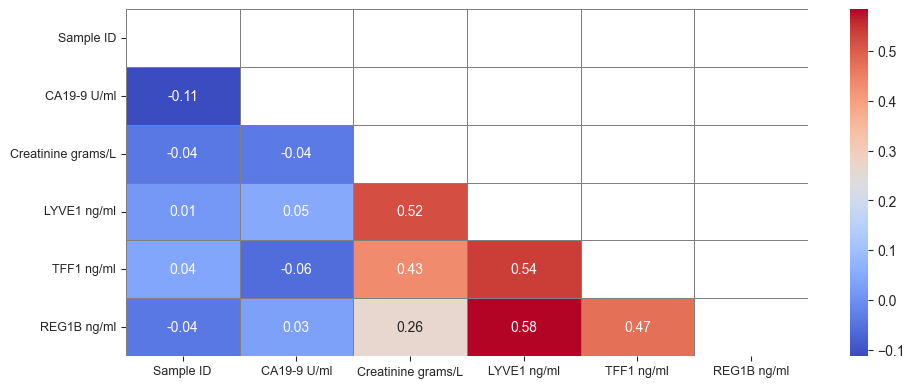

In [38]:
# Drawing a Heatmap Visualization to show and visualize the Correlation between (the different Numerical Columns) - of our Data...

sns.set_style('ticks')

                 # (Width, Height)
plt.figure(figsize=(11, 4.5))  # Setting the Figure Size of our drawing...

# `annot`        -> making annot Equal to True: to display the values (inside the heatmap drawing)
# `coolwarm`     -> Setting the colormap design to the: (coolwarm style)
# `mask`         -> to hide the upper triangle of the correlation matrix
# `numeric_only` -> to select only the numerical features of our dataset...
sns.heatmap(data.corr(numeric_only=True), cmap='coolwarm', annot=True, fmt='.2f', linecolor='gray', linewidths=0.6, annot_kws={'size': 10},
            mask=np.triu(np.ones_like(data.corr(numeric_only=True), dtype=bool)));

plt.xticks(fontsize=9, rotation=0)  # --> Adjusting the font size of the x-axis tick labels...

plt.yticks(fontsize=9);  # --> Adjusting the font size of the y-axis tick labels...

- 17

In [40]:
# for column in categorical columns...in our dataset
for col in data.select_dtypes(include='object').columns:
    
    print(f'\t\t{col} value counts: ')
    
    print(data[col].value_counts())
                 # .value_counts() --> to count the occurence of each value, in the specified column
    
    print('-' * 150)

		STUDY value counts: 
STUDY
SMHS    156
SWHS     75
SCCS     66
Name: count, dtype: int64
------------------------------------------------------------------------------------------------------------------------------------------------------
		Cases and matched ctrls year groups value counts: 
Cases and matched ctrls year groups
[3-4] ctrl    46
[2-3] ctrl    42
[1-2] ctrl    40
[0-1] ctrl    36
[4-5] ctrl    34
[3-4] case    23
[2-3] case    21
[1-2] case    20
[0-1] case    18
[4-5] case    17
Name: count, dtype: int64
------------------------------------------------------------------------------------------------------------------------------------------------------


- 18

		1. Boxplot of Sample ID


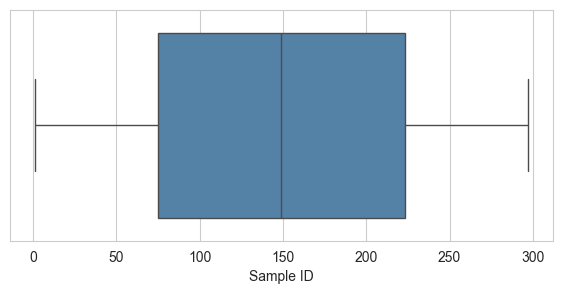

******************************************************************************************************************************************************
		2. Boxplot of CA19-9 U/ml


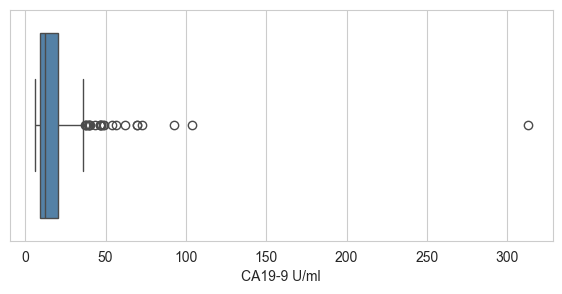

******************************************************************************************************************************************************
		3. Boxplot of Creatinine grams/L


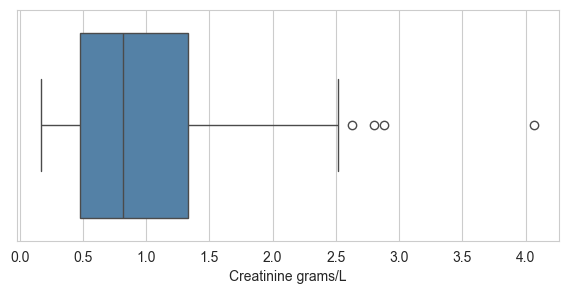

******************************************************************************************************************************************************
		4. Boxplot of LYVE1 ng/ml


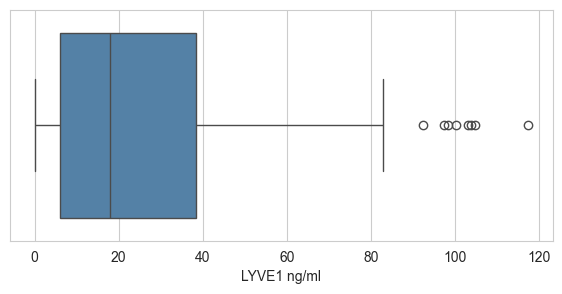

******************************************************************************************************************************************************
		5. Boxplot of TFF1 ng/ml


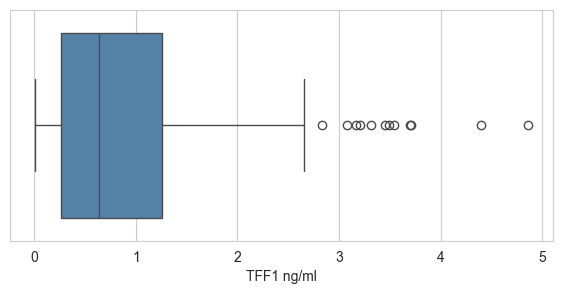

******************************************************************************************************************************************************
		6. Boxplot of REG1B ng/ml


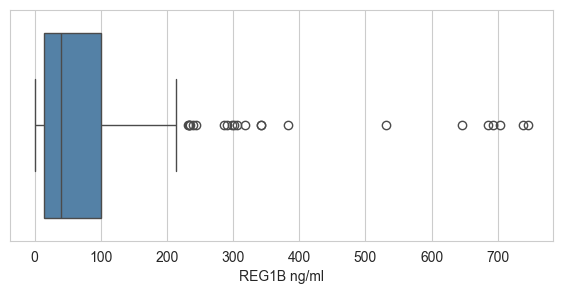

******************************************************************************************************************************************************


In [42]:
sns.set_style('whitegrid')  # Setting the style to --> whitegrid style...

counter = 1

# for column in numerical columns...
for col in data.select_dtypes(include='number').columns:

                     # (Width, Height)
    plt.figure(figsize=(7, 3))  # Adjusting the Figure size of our drawing...

    print(f'\t\t{counter}. Boxplot of {col}')

    # making a boxplot drawing...
    sns.boxplot(x=data[col], color='steelblue')

    plt.show()

    print('*' * 150)

    counter += 1

- 19

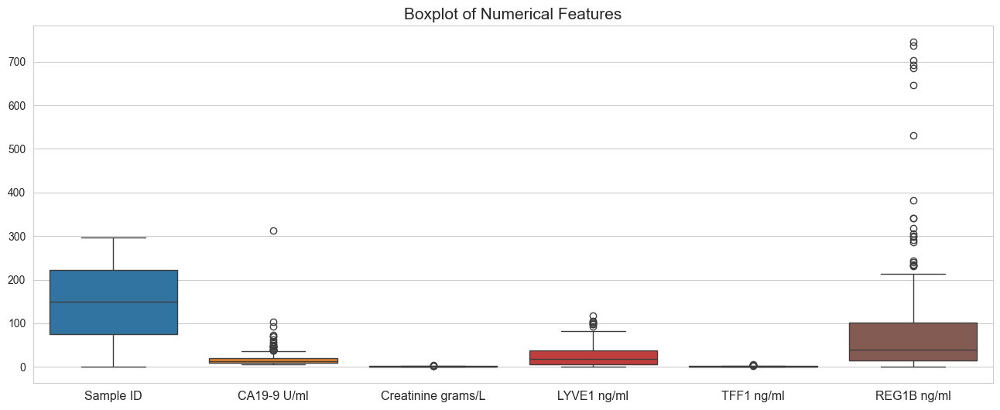

In [44]:
                 # (Width, Height)
plt.figure(figsize=(16, 6))  # Setting the Figure Size of our drawing...

# making a boxplot drawing...
sns.boxplot(data=data.select_dtypes(include=np.number))

plt.title('Boxplot of Numerical Features', fontsize=15)  # Adding a title, to our drawing...

plt.ticklabel_format(style='plain', axis='y')  # Displaying the y-axis tick labels in their plan format (without any changes).

plt.xticks(rotation=0, fontsize=11.5);  # Rotating the x-axis tick labels by 0 degrees...

- 20

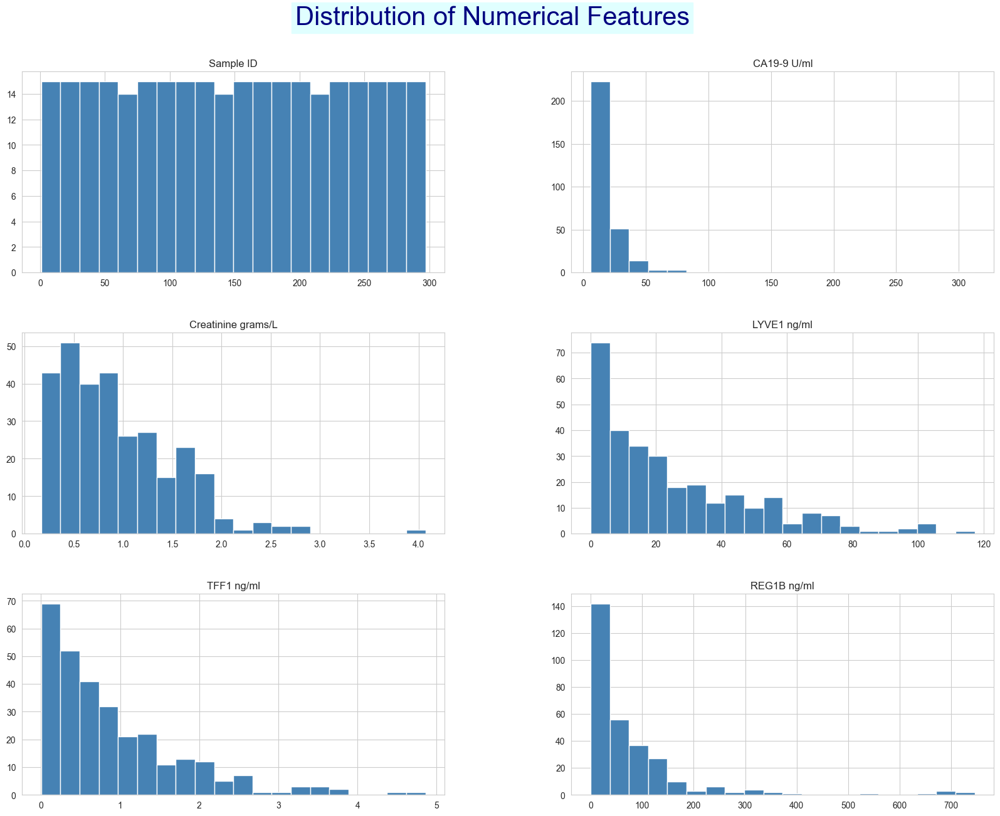

In [46]:
                         # (Width, Height)
data.hist(bins=20, figsize=(20, 15), color='steelblue')
        # bins --> specify the number of bins in the histogram drawing...

# Adding a super title, to the drawing...our drawing...
plt.suptitle('Distribution of Numerical Features', fontsize=30, color='navy', backgroundcolor='lightcyan', y=0.95);
                                                 # fontsize --> specifying the font size of the title.

### `Section 2` - Removing Irrelevant Columns - `Part 1`

- 1

In [49]:
data.head(1)

,STUDY,Sample ID,Cases and matched ctrls year groups,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
0,SWHS,1,[0-1] case,92.87,0.2,2.764,0.026,25.693


- 2

In [51]:
# Dropping the `Sample ID` column because it is just an identifier and does not provide any predictive value.

data = data.drop(columns=['Sample ID'])  # dropping the `Sample ID` column...

- 3

In [53]:
data.head(1)

,STUDY,Cases and matched ctrls year groups,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
0,SWHS,[0-1] case,92.87,0.2,2.764,0.026,25.693


### `Section 3` - Preparing the Target Column

- 1

In [56]:
data['Cases and matched ctrls year groups'].value_counts()

Cases and matched ctrls year groups
[3-4] ctrl    46
[2-3] ctrl    42
[1-2] ctrl    40
[0-1] ctrl    36
[4-5] ctrl    34
[3-4] case    23
[2-3] case    21
[1-2] case    20
[0-1] case    18
[4-5] case    17
Name: count, dtype: int64

- 2

In [58]:
data['diagnosis'] = data['Cases and matched ctrls year groups'].str.extract(r'(case|ctrl)')

diagnosis_mapping = {'ctrl': 0, 'case': 1}
data['diagnosis'] = data['diagnosis'].map(diagnosis_mapping)

- 3

In [60]:
data['diagnosis'].value_counts()

diagnosis
0    198
1     99
Name: count, dtype: int64

- 4

In [62]:
data = data.drop(columns=['Cases and matched ctrls year groups'])

### `Section 4` - Further Analysis of the Dataset

- 1

In [65]:
# Let's See the Correlation between (all the columns) and (the diagnosis column)...
correlation = data.corr(numeric_only=True)['diagnosis'].sort_values(ascending=False)
correlation

# Correlation can take values in the range from negative one till...positive one...

diagnosis             1.000000
REG1B ng/ml           0.034255
CA19-9 U/ml           0.005692
LYVE1 ng/ml          -0.030859
Creatinine grams/L   -0.034879
TFF1 ng/ml           -0.039715
Name: diagnosis, dtype: float64

- 2

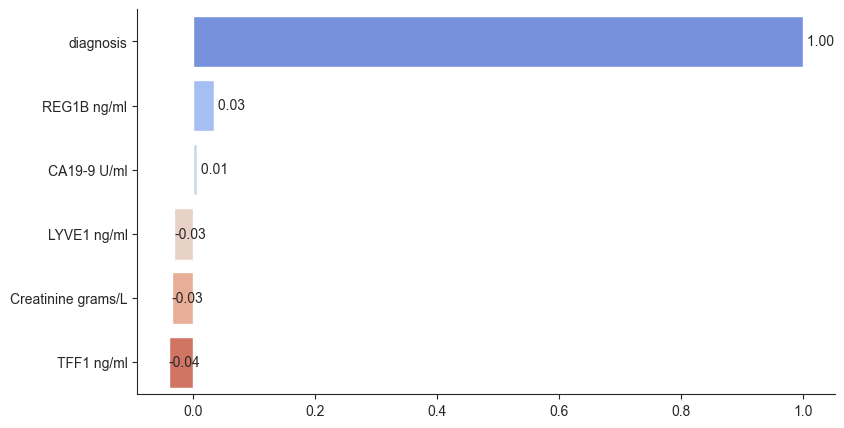

In [67]:
sns.set_style('ticks')

                 # (Width, Height)
plt.figure(figsize=(9, 5))  # Adjusting the Figure size of the drawing...our drawing...

# making a barplot drawing...
sns.barplot(x=correlation.values, y=correlation.index, hue=correlation.index, palette='coolwarm')

                  # enumerate --> to loop through something...with its index (at the same time)
for index, value in enumerate(correlation.values):

    # Checking if the value is finite (not NaN or infinite) - to avoid any errors...
    if np.isfinite(value):

        # Adding text to our drawing...
        plt.text(value, index, f'{value: .2f}', va='center')

plt.ylabel('');

sns.despine();  # -> Removes the top and right borders from our drawing...

- 3

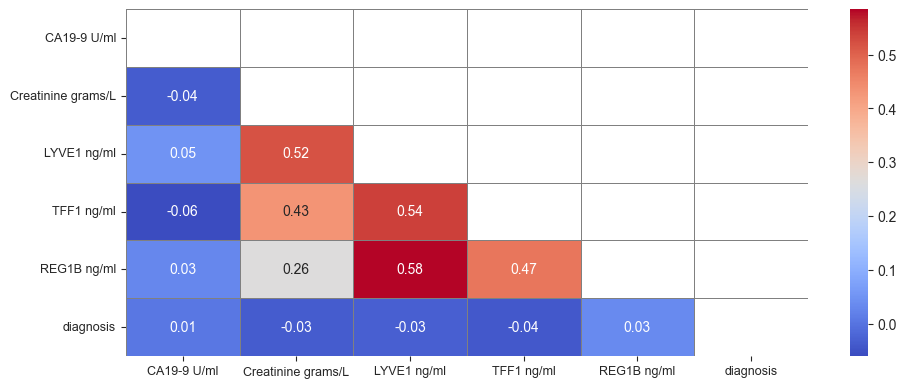

In [69]:
# Drawing a Heatmap Visualization to show and visualize the Correlation between (the different Numerical Columns) - of our Data...

sns.set_style('ticks')

                 # (Width, Height)
plt.figure(figsize=(11, 4.5))  # Setting the Figure Size of our drawing...

# `annot`        -> making annot Equal to True: to display the values (inside the heatmap drawing)
# `coolwarm`     -> Setting the colormap design to the: (coolwarm style)
# `mask`         -> to hide the upper triangle of the correlation matrix
# `numeric_only` -> to select only the numerical features of our dataset...
sns.heatmap(data.corr(numeric_only=True), cmap='coolwarm', annot=True, fmt='.2f', linecolor='gray', linewidths=0.6, annot_kws={'size': 10},
            mask=np.triu(np.ones_like(data.corr(numeric_only=True), dtype=bool)));

plt.xticks(fontsize=9, rotation=0)  # --> Adjusting the font size of the x-axis tick labels...

plt.yticks(fontsize=9);  # --> Adjusting the font size of the y-axis tick labels...

- 4

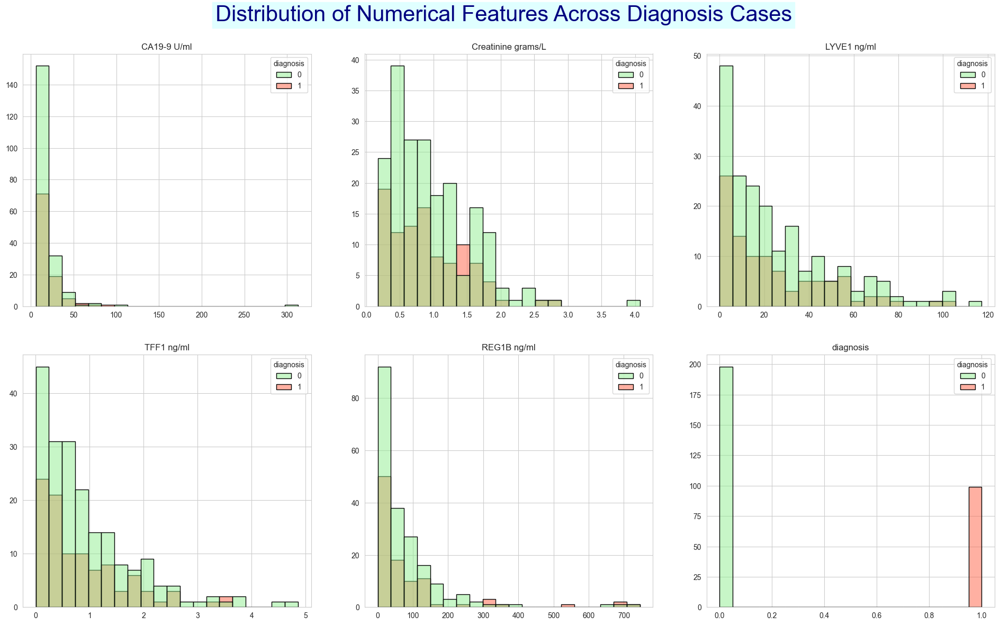

In [71]:
sns.set_style('whitegrid')

                      # (rows, columns)
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
                                     # (Width, Height)

fig.tight_layout(pad=4.5)  # --> Adjusting the layout of the drawing, to prevent any overlapping from happening

# Adding a super title, to our drawing...
plt.suptitle('Distribution of Numerical Features Across Diagnosis Cases', fontsize=30, color='navy', backgroundcolor='lightcyan', y=1.02)

# selecting numerical columns - of our dataset ONLY
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Looping through each numerical column to create its own histogram...
for i, column in enumerate(numerical_columns):
    
    ax = axes[i // 3, i % 3]

    # Defining a custom coloring palette.
    custom_palette = {0: 'lightgreen', 1: 'tomato'}
    
    # making a histogram drawing here...
    sns.histplot(data, x=column, hue='diagnosis', ax=ax, bins=20, edgecolor='black', palette=custom_palette)

    ax.set_title(column)
    ax.set_xlabel('')
    ax.set_ylabel('')

# Turning off any unused subplots
total_plots = len(numerical_columns)
for j in range(total_plots, 6):  
    fig.axes[j].axis('off')

- 5

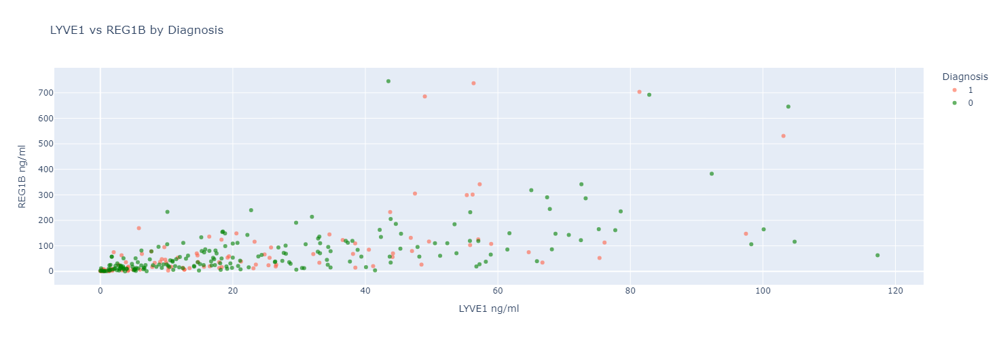

In [73]:
import plotly.express as px

data["diagnosis_str"] = data["diagnosis"].astype(str)

fig = px.scatter(data, 
                 x="LYVE1 ng/ml", 
                 y="REG1B ng/ml", 
                 color="diagnosis_str", 
                 color_discrete_map={'0': 'green', '1': 'tomato'},
                 opacity=0.6,
                 title='LYVE1 vs REG1B by Diagnosis')
fig.update_layout(
    width=1_000,
    height=500,
    legend_title_text='Diagnosis'
)
fig.show()

data.drop(columns=["diagnosis_str"], inplace=True)

- 6

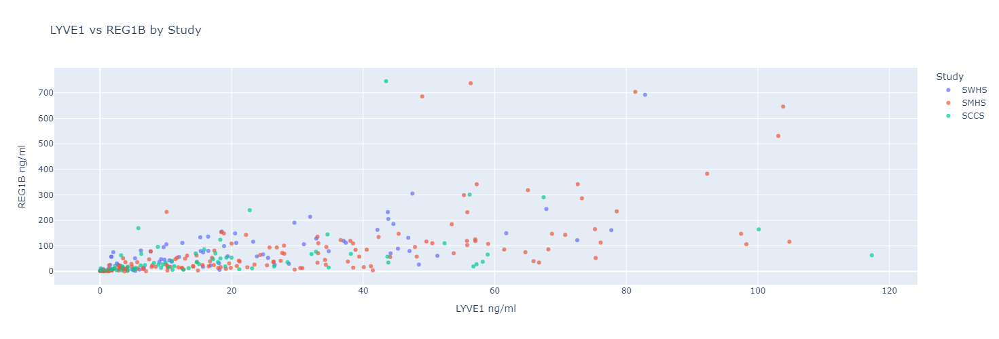

In [75]:
import plotly.express as px

fig = px.scatter(data, 
                 x="LYVE1 ng/ml", 
                 y="REG1B ng/ml", 
                 color="STUDY", 
                 opacity=0.7,
                 title='LYVE1 vs REG1B by Study')
fig.update_layout(
    width=1_000,
    height=500,
    legend_title_text='Study'
)
fig.show()

- 7

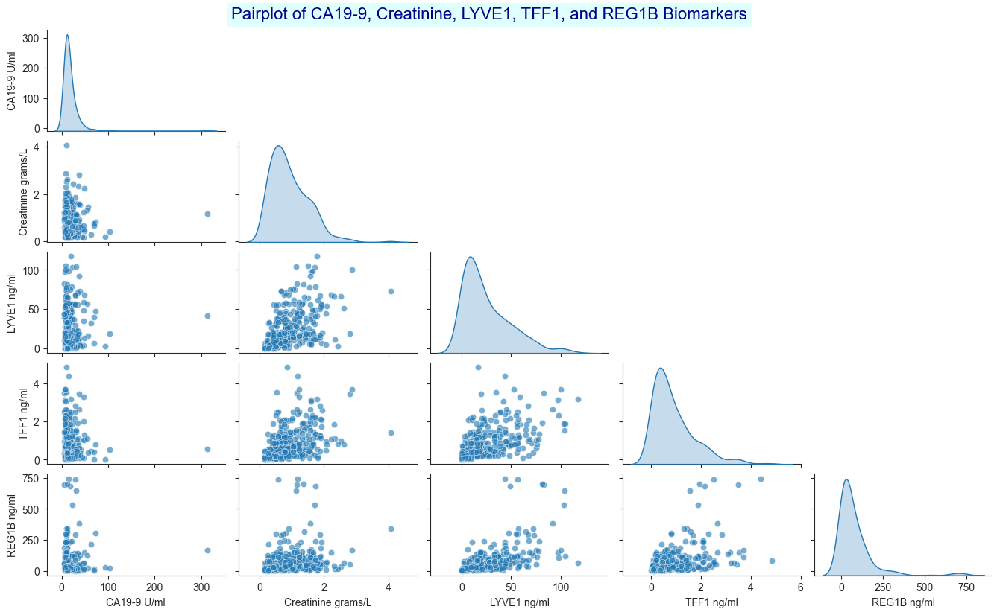

In [77]:
# Setting the visual style of the plot to 'ticks'
sns.set_style('ticks')

selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']

pairplot_data = data[selected_features]

# Drawing a Pairplot (Scatter Matrix) - using Seaborn Library
pair = sns.pairplot(
    data=pairplot_data,
    vars=selected_features,
    diag_kind='kde',               # Using KDE (smooth curve) for the diagonal histograms
    plot_kws={'alpha': 0.6},       # alpha --> transparency of the scatter dots
    height=1.8                     # Size of each subplot
)

pair.fig.set_size_inches(14, 8)  

# Removing the upper triangle 
num_vars = len(selected_features)
for i in range(num_vars):
    for j in range(num_vars):
        if j > i:
            pair.axes[i, j].set_visible(False)

# Adding a Title above all subplots
plt.suptitle('Pairplot of CA19-9, Creatinine, LYVE1, TFF1, and REG1B Biomarkers', y=1.02, fontsize=16, 
             color='darkblue', backgroundcolor='lightcyan')

plt.show()

- 8

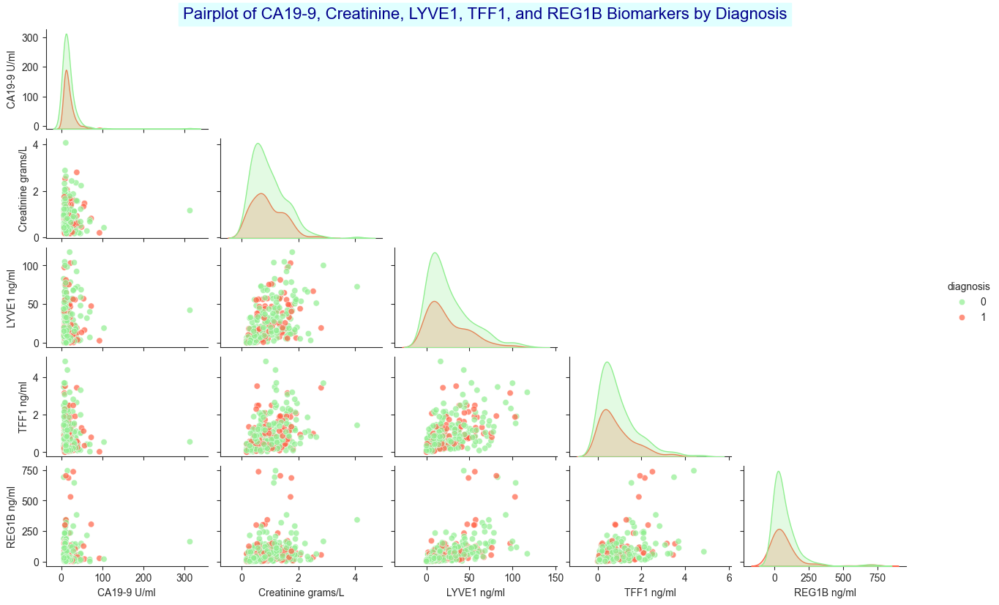

In [79]:
# Setting the visual style of the plot to 'ticks'
sns.set_style('ticks')

selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']

pairplot_data = data[selected_features + ['diagnosis']]

# Drawing a Pairplot (Scatter Matrix) - using Seaborn Library
pair = sns.pairplot(
    data=pairplot_data,
    vars=selected_features,
    palette=custom_palette,
    hue='diagnosis',
    diag_kind='kde',               # Using KDE (smooth curve) for the diagonal histograms
    plot_kws={'alpha': 0.7},       # alpha --> transparency of the scatter dots
    height=1.8                     # Size of each subplot
)

pair.fig.set_size_inches(14, 8)  

# Removing the upper triangle 
num_vars = len(selected_features)
for i in range(num_vars):
    for j in range(num_vars):
        if j > i:
            pair.axes[i, j].set_visible(False)

# Adding a Title above all subplots
plt.suptitle('Pairplot of CA19-9, Creatinine, LYVE1, TFF1, and REG1B Biomarkers by Diagnosis', y=1.02, fontsize=16, 
             color='darkblue', backgroundcolor='lightcyan')

plt.show()

- 9

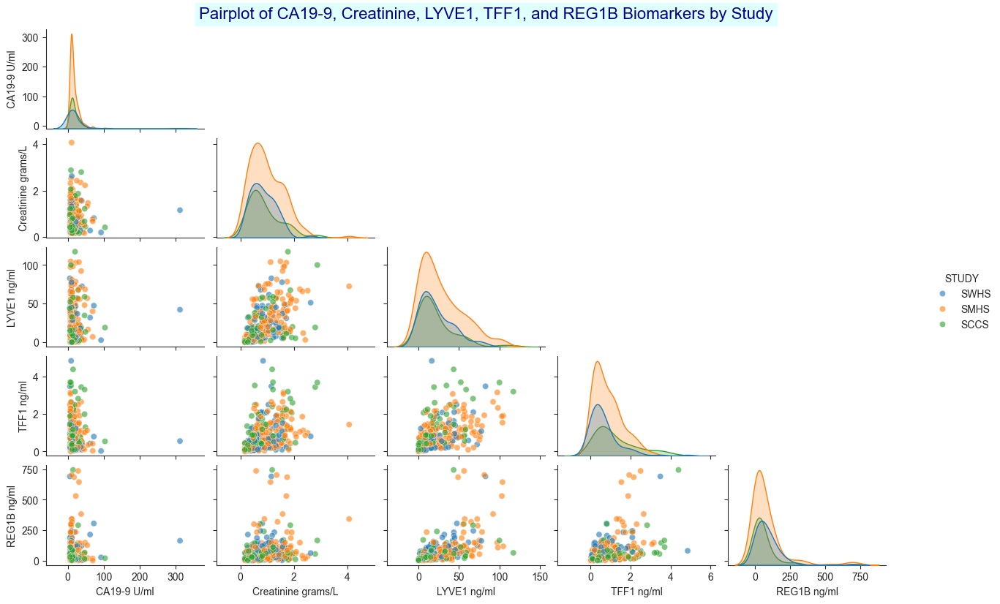

In [81]:
# Setting the visual style of the plot to 'ticks'
sns.set_style('ticks')

selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']

pairplot_data = data[selected_features + ['STUDY']]

# Drawing a Pairplot (Scatter Matrix) - using Seaborn Library
pair = sns.pairplot(
    data=pairplot_data,
    vars=selected_features,
    hue='STUDY',
    diag_kind='kde',               # Using KDE (smooth curve) for the diagonal histograms
    plot_kws={'alpha': 0.6},       # alpha --> transparency of the scatter dots
    height=1.8                     # Size of each subplot
)

pair.fig.set_size_inches(14, 8)  

# Removing the upper triangle 
num_vars = len(selected_features)
for i in range(num_vars):
    for j in range(num_vars):
        if j > i:
            pair.axes[i, j].set_visible(False)

# Adding a Title above all subplots
plt.suptitle('Pairplot of CA19-9, Creatinine, LYVE1, TFF1, and REG1B Biomarkers by Study', y=1.02, fontsize=16, 
             color='darkblue', backgroundcolor='lightcyan')

plt.show()

- 10

In [83]:
features_to_summarize = [
    'CA19-9 U/ml',
    'Creatinine grams/L',
    'LYVE1 ng/ml',
    'TFF1 ng/ml',
    'REG1B ng/ml'
]

summary_table = data.groupby('diagnosis')[features_to_summarize].mean().T

summary_table.index = [
    'Mean CA19-9 (U/ml)',
    'Mean Creatinine (g/L)',
    'Mean LYVE1 (ng/ml)',
    'Mean TFF1 (ng/ml)',
    'Mean REG1B (ng/ml)'
]

summary_table.rename(columns={
    0: 'Healthy',
    1: 'Pancreatic Cancer'
}, inplace=True)

summary_table

diagnosis,Healthy,Pancreatic Cancer
Mean CA19-9 (U/ml),18.069444,18.330808
Mean Creatinine (g/L),0.948838,0.905354
Mean LYVE1 (ng/ml),26.020217,24.426121
Mean TFF1 (ng/ml),0.938313,0.866303
Mean REG1B (ng/ml),76.283510,84.771343


- 11

In [85]:
features_to_summarize = [
    'CA19-9 U/ml',
    'Creatinine grams/L',
    'LYVE1 ng/ml',
    'TFF1 ng/ml',
    'REG1B ng/ml'
]

summary_table = data.groupby('STUDY')[features_to_summarize].mean().T

summary_table.index = [
    'Mean CA19-9 (U/ml)',
    'Mean Creatinine (g/L)',
    'Mean LYVE1 (ng/ml)',
    'Mean TFF1 (ng/ml)',
    'Mean REG1B (ng/ml)'
]

summary_table.rename(columns={
    'SMHS': 'Shanghai Men’s Study',
    'SWHS': 'Shanghai Women’s Study',
    'SCCS': 'Southern Community Cohort Study'
}, inplace=True)

summary_table

STUDY,Southern Community Cohort Study,Shanghai Men’s Study,Shanghai Women’s Study
Mean CA19-9 (U/ml),18.721970,17.057692,19.944667
Mean Creatinine (g/L),0.903030,0.986410,0.853600
Mean LYVE1 (ng/ml),22.005803,28.533276,22.221533
Mean TFF1 (ng/ml),1.264758,0.868410,0.701387
Mean REG1B (ng/ml),62.318788,82.235282,87.396720


- 12

In [87]:
# Step 1: Prepare the data
data["diagnosis_str"] = data["diagnosis"].astype(str)

scatter_data = data[['LYVE1 ng/ml', 'REG1B ng/ml', 'TFF1 ng/ml', 'diagnosis_str']]

# Step 2: Create the 3D scatter plot
fig = px.scatter_3d(
    scatter_data,
    x='LYVE1 ng/ml',
    y='REG1B ng/ml',
    z='TFF1 ng/ml',
    color='diagnosis_str',
    color_discrete_map={'0': 'green', '1': 'tomato'},
    title='3D Plot: LYVE1 vs REG1B vs TFF1 Colored by Diagnosis'
)

# Step 3: Customize the layout
fig.update_layout(
    scene=dict(
        xaxis_title='LYVE1 (ng/ml)',
        yaxis_title='REG1B (ng/ml)',
        zaxis_title='TFF1 (ng/ml)'
    ),
    width=1000,
    height=700,
    legend_title_text='Diagnosis'
)

fig.update_traces(marker=dict(opacity=0.75))

# Step 4: Show the figure
fig.show()

data.drop(columns=["diagnosis_str"], inplace=True)

- 13

In [89]:
scatter_data = data[['LYVE1 ng/ml', 'REG1B ng/ml', 'TFF1 ng/ml', 'STUDY']]

# Step 2: Create the 3D scatter plot
fig = px.scatter_3d(
    scatter_data,
    x='LYVE1 ng/ml',
    y='REG1B ng/ml',
    z='TFF1 ng/ml',
    color='STUDY',
    color_discrete_map={
        'SMHS': 'royalblue',
        'SWHS': 'darkorange',
        'SCCS': 'mediumseagreen'
    },
    title='3D Plot: LYVE1 vs TFF1 vs REG1B Colored by Study'
)

# Step 3: Customize the layout
fig.update_layout(
    scene=dict(
        xaxis_title='LYVE1 (ng/ml)',
        yaxis_title='REG1B (ng/ml)',
        zaxis_title='TFF1 (ng/ml)'
    ),
    width=1000,
    height=700,
    legend_title_text='Study'
)

fig.update_traces(marker=dict(opacity=0.75))

# Step 4: Show the figure
fig.show()

### `Section 5` - Providing the Necessary Plots and EDA (for each Feature)

- **Feature 0 - STUDY**

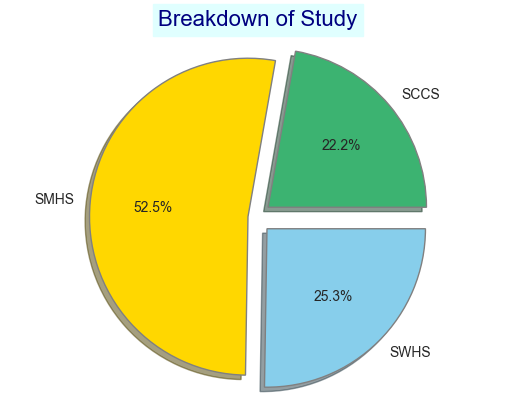

In [92]:
data['STUDY'].value_counts().plot(kind='pie',
                                  autopct='%1.1f%%',
                                  startangle=80,
                                  colors=['gold', 'skyblue', 'mediumseagreen'],
                                  wedgeprops={'edgecolor': 'gray'},
                                  shadow=True,
                                  explode=(0.05, 0.1, 0.1))
plt.ylabel('');

plt.axis('equal')  # to ensure that the pie chart is drawn with equal aspect ratio, along the x-axis and y-axis, resulting in a circular pie chart

# Adding a title to our drawing...
plt.title('Breakdown of Study', fontsize=16, color='navy', backgroundcolor='lightcyan');

In [93]:
'''
    Note about the `annotate_bars_vertically` function below:
        - I didn't make this function from scratch, instead rather I took its idea from GeeksForGeeks Website.

        - Here's the link to the original source code:
            https://www.geeksforgeeks.org/how-to-annotate-bars-in-barplot-with-matplotlib-in-python/
''';

def annotate_bars_vertically(ax):
    for p in ax.patches:
        if p.get_height() > 0:
            ax.annotate(f'{int(p.get_height())}',  
                        (p.get_x() + p.get_width() / 2., p.get_height()),  
                        ha='center', 
                        va='center',  
                        fontsize=10,  
                        color='black',  
                        xytext=(0, 5),
                        textcoords='offset points')

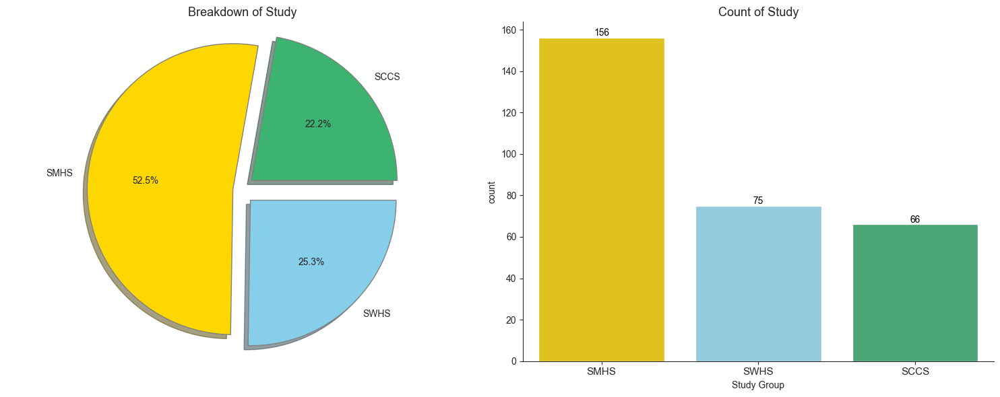

In [94]:
sns.set_style('ticks')

                                     # (Width, Height)
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
                      # (Rows, Columns)

# 1. Pie Chart Drawing
data['STUDY'].value_counts().plot(kind='pie',
                                  autopct='%1.1f%%',
                                  startangle=80,
                                  colors=['gold', 'skyblue', 'mediumseagreen'],
                                  wedgeprops={'edgecolor': 'gray'},
                                  shadow=True,
                                  explode=(0.05, 0.1, 0.1),
                                  ax=axes[0])
axes[0].axis('equal')
axes[0].set_ylabel('')
axes[0].set_title('Breakdown of Study', fontsize=13)

# 2. Count Plot Drawing
ax = sns.countplot(data=data, x='STUDY', hue='STUDY',
                   palette=['skyblue', 'gold', 'mediumseagreen'],
                   ax=axes[1], order=['SMHS', 'SWHS', 'SCCS'], legend=False)
annotate_bars_vertically(ax)
axes[1].set_xlabel('Study Group')
axes[1].set_title('Count of Study', fontsize=13)
axes[1].set_xticks(ticks=[0, 1, 2], labels=['SMHS', 'SWHS', 'SCCS'], fontsize=11)
sns.despine()
plt.tight_layout()
plt.show()

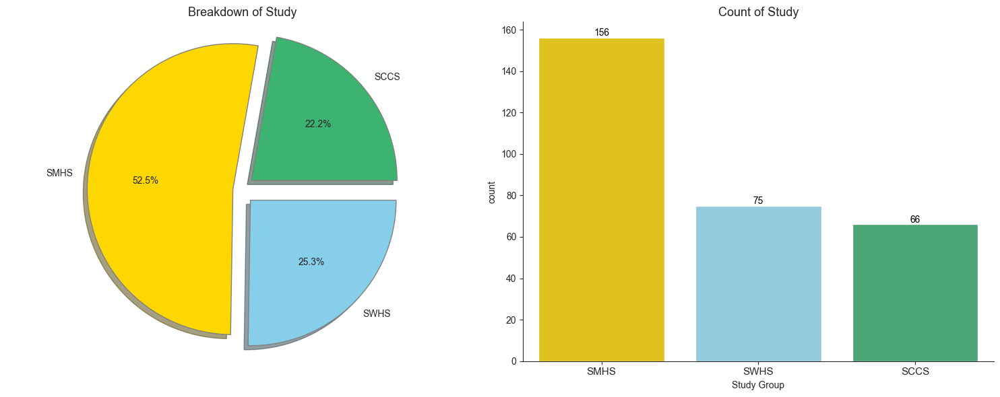

******************************************************************************************************************************************************


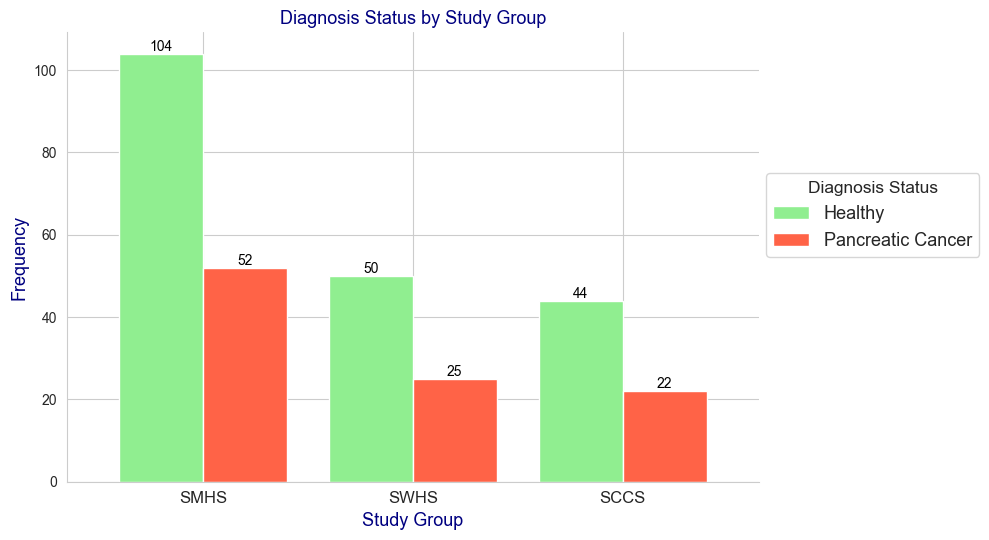

In [95]:
sns.set_style('ticks')

                                     # (Width, Height)
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
                      # (Rows, Columns)

# 1. Pie Chart Drawing
data['STUDY'].value_counts().plot(kind='pie',
                                  autopct='%1.1f%%',
                                  startangle=80,
                                  colors=['gold', 'skyblue', 'mediumseagreen'],
                                  wedgeprops={'edgecolor': 'gray'},
                                  shadow=True,
                                  explode=(0.05, 0.1, 0.1),
                                  ax=axes[0])
axes[0].axis('equal')
axes[0].set_ylabel('')
axes[0].set_title('Breakdown of Study', fontsize=13)

# 2. Count Plot Drawing
ax = sns.countplot(data=data, x='STUDY', hue='STUDY',
                   palette=['skyblue', 'gold', 'mediumseagreen'],
                   ax=axes[1], order=['SMHS', 'SWHS', 'SCCS'], legend=False)
annotate_bars_vertically(ax)
axes[1].set_xlabel('Study Group')
axes[1].set_title('Count of Study', fontsize=13)
axes[1].set_xticks(ticks=[0, 1, 2], labels=['SMHS', 'SWHS', 'SCCS'], fontsize=11)
sns.despine()
plt.tight_layout()
plt.show()

print('*' * 150)

# 3. Bar Plot Drawing
grouped_study_diagnosis = data.groupby(['STUDY', 'diagnosis']).size().unstack(fill_value=0)
grouped_study_diagnosis = grouped_study_diagnosis.reindex(['SMHS', 'SWHS', 'SCCS'])

sns.set_style('whitegrid')
ax = grouped_study_diagnosis.plot(kind='bar', figsize=(10, 5.5), width=0.8, color=custom_palette)
annotate_bars_vertically(ax)

plt.title('Diagnosis Status by Study Group', color='navy', fontsize=13)
plt.xlabel('Study Group', color='navy', fontsize=13)
plt.ylabel('Frequency', color='navy', fontsize=13)

plt.legend(['Healthy', 'Pancreatic Cancer'], 
           loc=(1.01, 0.5), title='Diagnosis Status', fontsize=13, title_fontsize=12.5)
plt.xticks(rotation=0, ticks=[0, 1, 2], labels=['SMHS', 'SWHS', 'SCCS'], fontsize=12)

sns.despine()
plt.tight_layout()
plt.show()

- **Feature 1 - CA19-9 U/ml**

In [97]:
                    # parameters of the function
def boxplot_with_stats(data, column, annotation_start = 5, annotation_spacing = 0.5):
                    # Parameters Explanation:-
                    # data               -> the dataset that we are working on
                    # column             -> the specific column that we want to make the boxplot for
                    # annotation_start   -> the starting position for annotating on the boxplot
                    # annotation_spacing -> the vertical spacing between annotations
    
    sns.set_style('whitegrid')  # Setting the style of the drawing, to: `white grid`

                     # (Width, Height)
    plt.figure(figsize=(8, 6))  # Setting the Figure Size

    # Creating a boxplot
    plt.boxplot(data[column], patch_artist=True)
                            # Setting patch_artist to -> True, to fill the box with colors
    
    # Setting a title - Adding a title to the drawing...
    plt.title(f'{column}', fontsize=18, color='navy', backgroundcolor='lightcyan', pad=12)
    
    # Removing x-axis ticks
    plt.xticks([])

    # Calculating statistics
    mean_value    = data[column].mean()
    median_value  = data[column].median()
    mode_value    = data[column].mode()[0]
    maximum_value = data[column].max()  # maximum
    minimum_value = data[column].min()
    range_value   = maximum_value - minimum_value
    Q1            = data[column].quantile(0.25)
    Q3            = data[column].quantile(0.75)
    IQR           = Q3 - Q1 
    std_dev       = data[column].std()
    variance      = data[column].var()

    # Adding mean, median, and mode lines
    plt.axhline(mean_value,   color='red',    linestyle='--', label=f'Mean   : {mean_value: .2f}')
    plt.axhline(median_value, color='green',  linestyle='-',  label=f'Median: {median_value: .2f}')
    plt.axhline(mode_value,   color='orange', linestyle=':',  label=f'Mode   : {mode_value: .2f}') 

    # Adding text for the different statistics
    plt.text(1.60, annotation_start                         , f'      Range : {range_value: .2f}', fontsize=14)
    plt.text(1.60, annotation_start - annotation_spacing    , f'      IQR     : {IQR: .2f}'      , fontsize=14)    
    plt.text(1.60, annotation_start - 2 * annotation_spacing, f'     Std Dev: {std_dev: .2f}'    , fontsize=14)    
    plt.text(1.60, annotation_start - 3 * annotation_spacing, f'    Variance: {variance: .2f}'   , fontsize=14)    
    
    # Adding a legend, to the drawing
    plt.legend(loc=(1.05, 0.5), fontsize=14, title='Summary Statistics')
             # loc -> to specify the location of the legend

    # Diplaying the current drawing, and showing it (to the screen)
    plt.ticklabel_format(style='plain', axis='y')

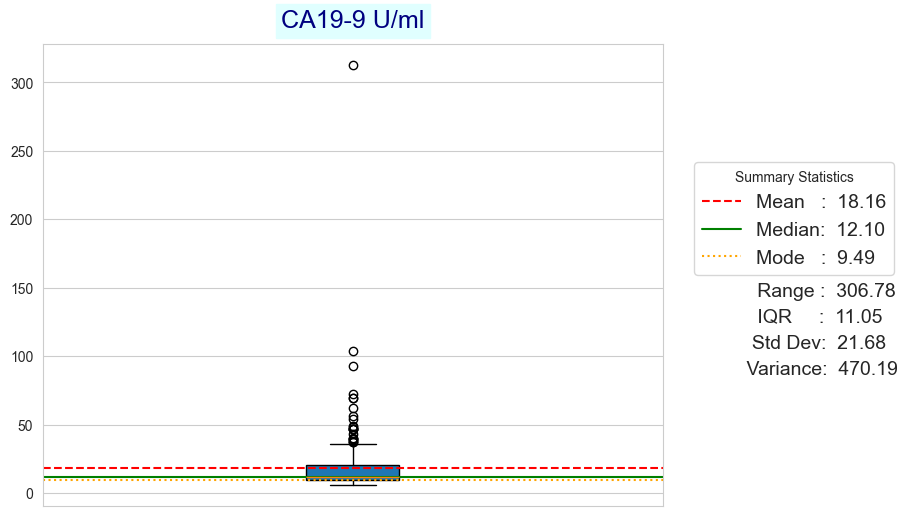

In [98]:
boxplot_with_stats(data, 'CA19-9 U/ml', annotation_start=144, annotation_spacing=19)

In [99]:
data['CA19-9 U/ml'].max()  # maximum CA19-9 U/ml...

312.69

In [100]:
data['CA19-9 U/ml'].min()  # minimum CA19-9 U/ml...

5.91

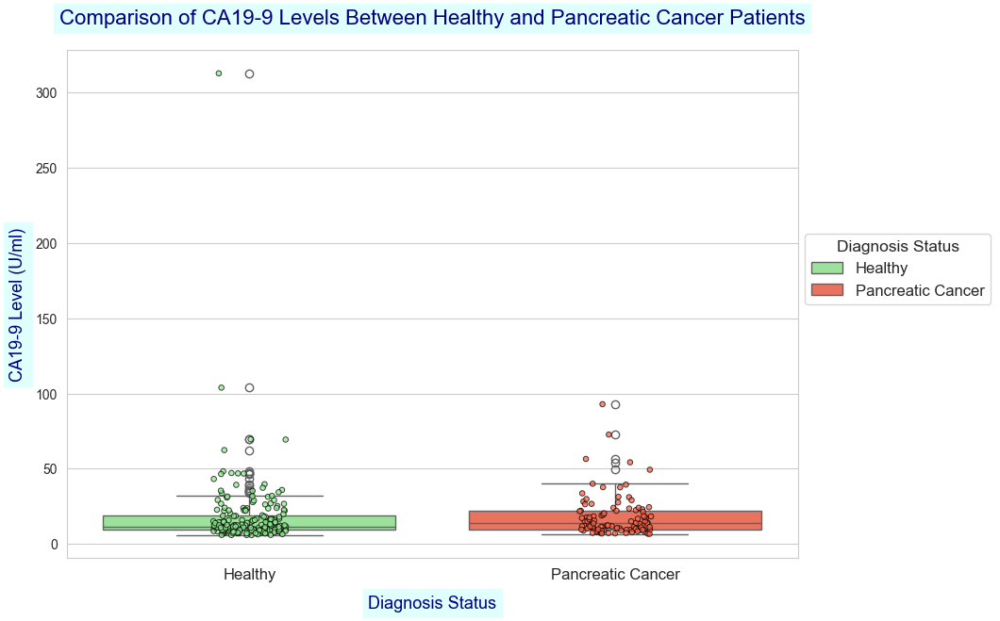

In [101]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of CA19-9 Levels Between Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='diagnosis', y='CA19-9 U/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='diagnosis', y='CA19-9 U/ml', hue='diagnosis', palette=custom_palette, dodge=False,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('CA19-9 Level (U/ml)', fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Diagnosis Status',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(ticks=[0, 1], labels=['Healthy', 'Pancreatic Cancer'], fontsize=12);

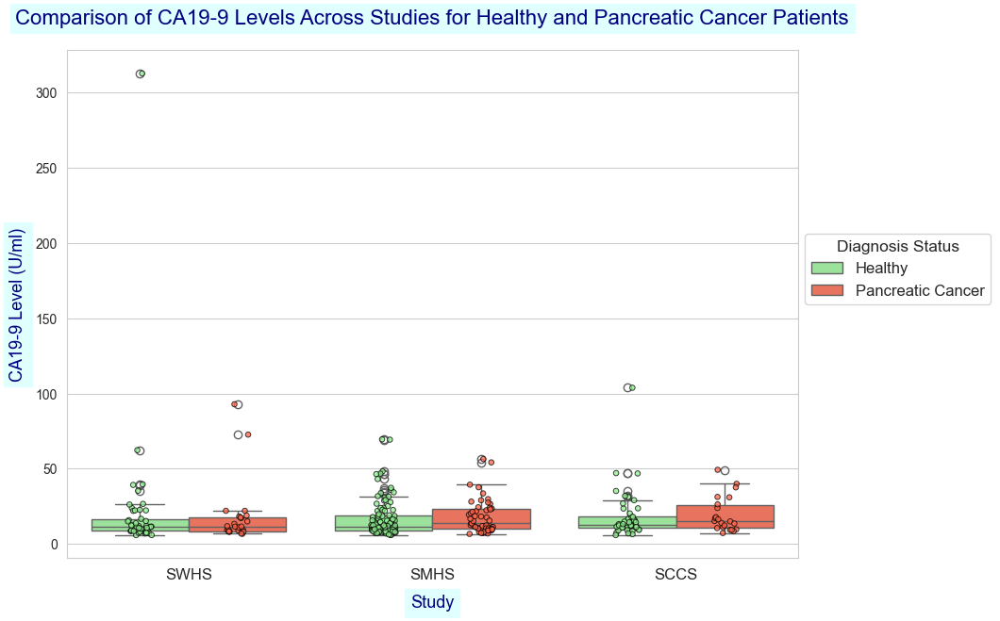

In [102]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of CA19-9 Levels Across Studies for Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='STUDY', y='CA19-9 U/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='STUDY', y='CA19-9 U/ml', hue='diagnosis', palette=custom_palette, dodge=True,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('CA19-9 Level (U/ml)', fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Study',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(fontsize=12);

- **Feature 2 - Creatinine grams/L**

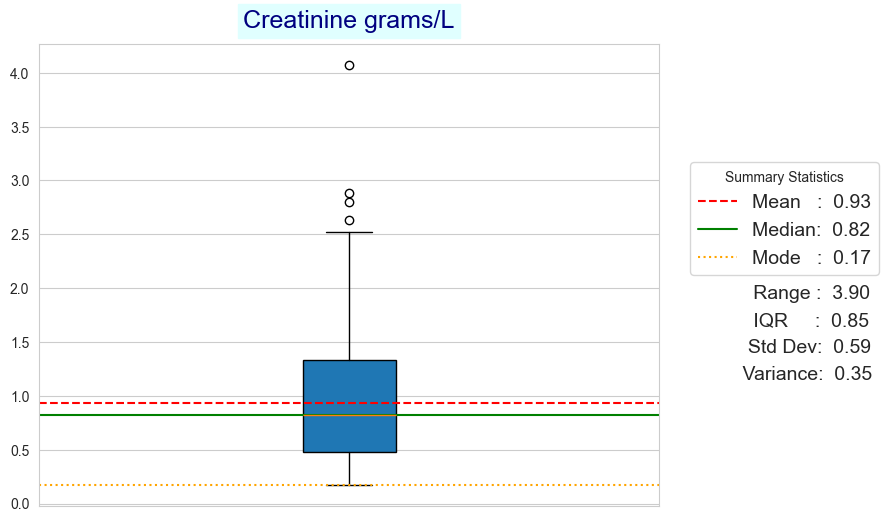

In [104]:
boxplot_with_stats(data, 'Creatinine grams/L', annotation_start=1.9, annotation_spacing=0.25)

In [105]:
data['Creatinine grams/L'].max()  # maximum Creatinine grams/L...

4.07

In [106]:
data['Creatinine grams/L'].min()  # minimum Creatinine grams/L...

0.17

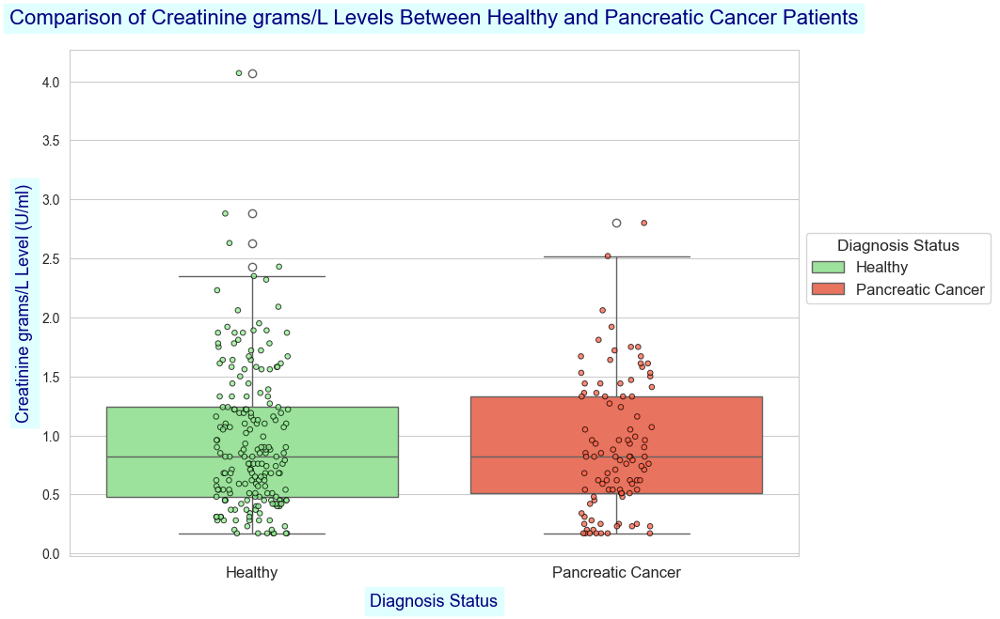

In [107]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of Creatinine grams/L Levels Between Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='diagnosis', y='Creatinine grams/L', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='diagnosis', y='Creatinine grams/L', hue='diagnosis', palette=custom_palette, dodge=False,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('Creatinine grams/L Level (U/ml)', fontsize=13, color='navy', backgroundcolor='lightcyan', 
           labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Diagnosis Status',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(ticks=[0, 1], labels=['Healthy', 'Pancreatic Cancer'], fontsize=12);

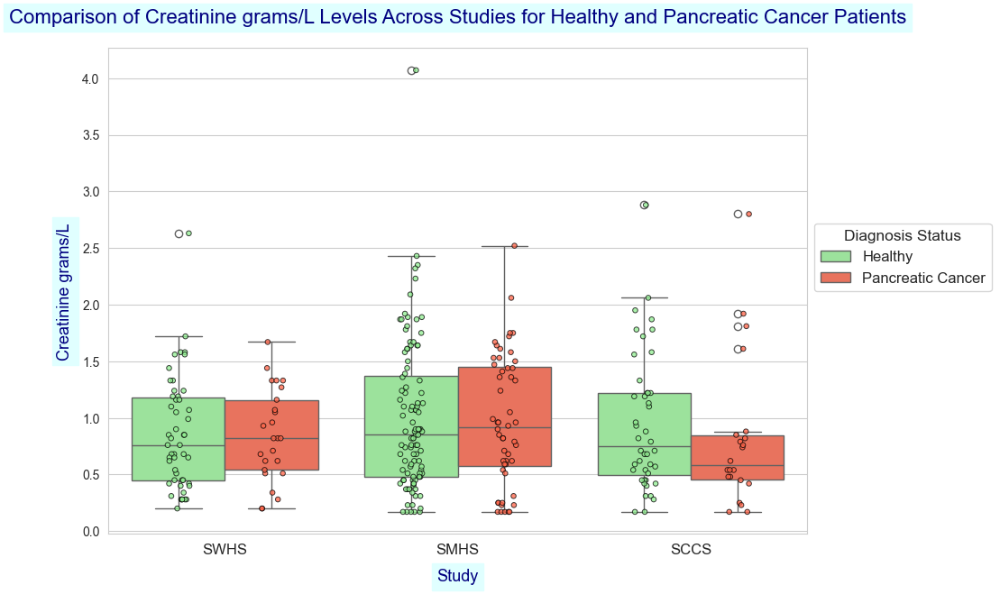

In [108]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of Creatinine grams/L Levels Across Studies for Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='STUDY', y='Creatinine grams/L', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='STUDY', y='Creatinine grams/L', hue='diagnosis', palette=custom_palette, dodge=True,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('Creatinine grams/L', fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Study',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(fontsize=12);

- **Feature 3 - LYVE1 ng/ml**

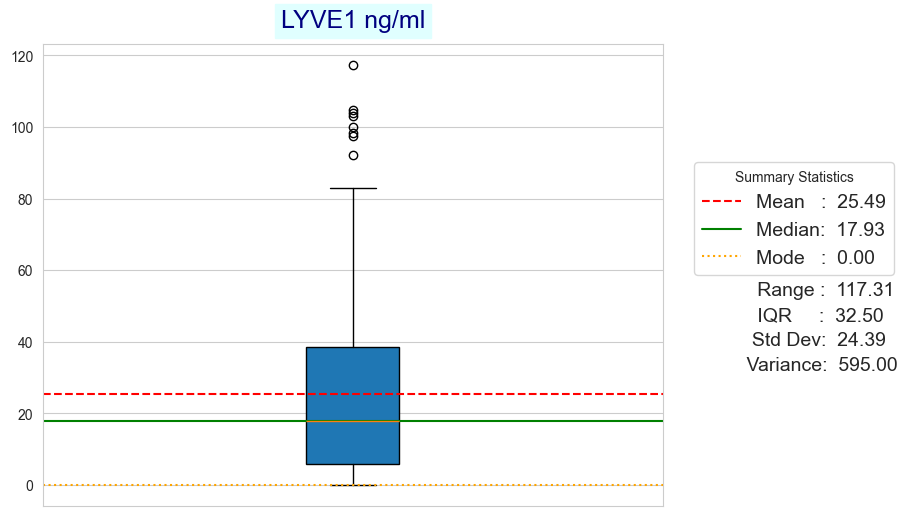

In [110]:
boxplot_with_stats(data, 'LYVE1 ng/ml', annotation_start=53, annotation_spacing=7)

In [111]:
data['LYVE1 ng/ml'].max()  # maximum LYVE1 ng/ml...

117.313

In [112]:
data['LYVE1 ng/ml'].min()  # minimum LYVE1 ng/ml...

0.0

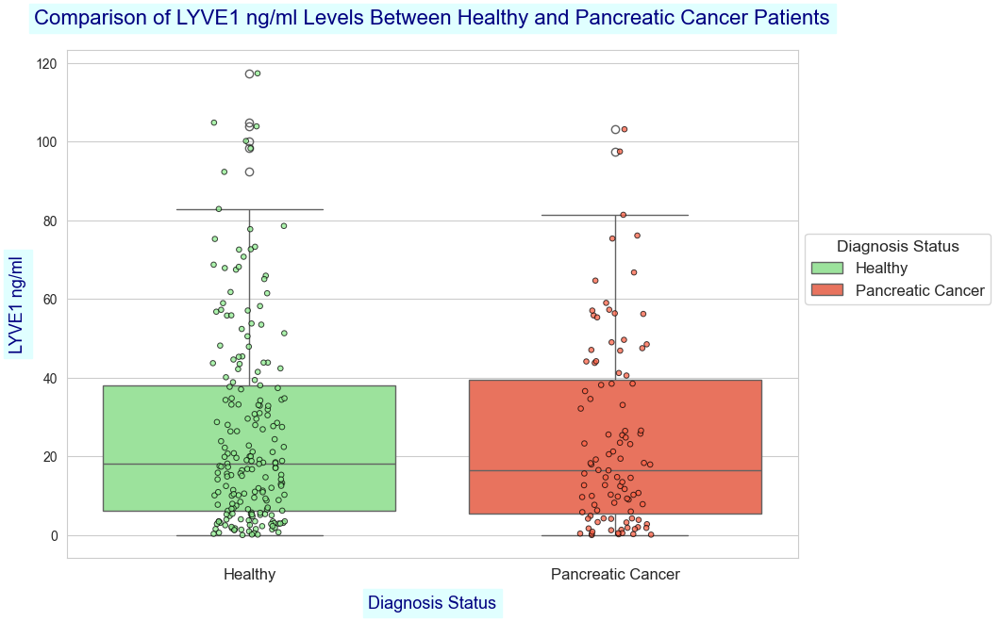

In [113]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of LYVE1 ng/ml Levels Between Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='diagnosis', y='LYVE1 ng/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='diagnosis', y='LYVE1 ng/ml', hue='diagnosis', palette=custom_palette, dodge=False,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('LYVE1 ng/ml', fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=7)           # Adding an y-label to the drawing
plt.xlabel('Diagnosis Status',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(ticks=[0, 1], labels=['Healthy', 'Pancreatic Cancer'], fontsize=12);

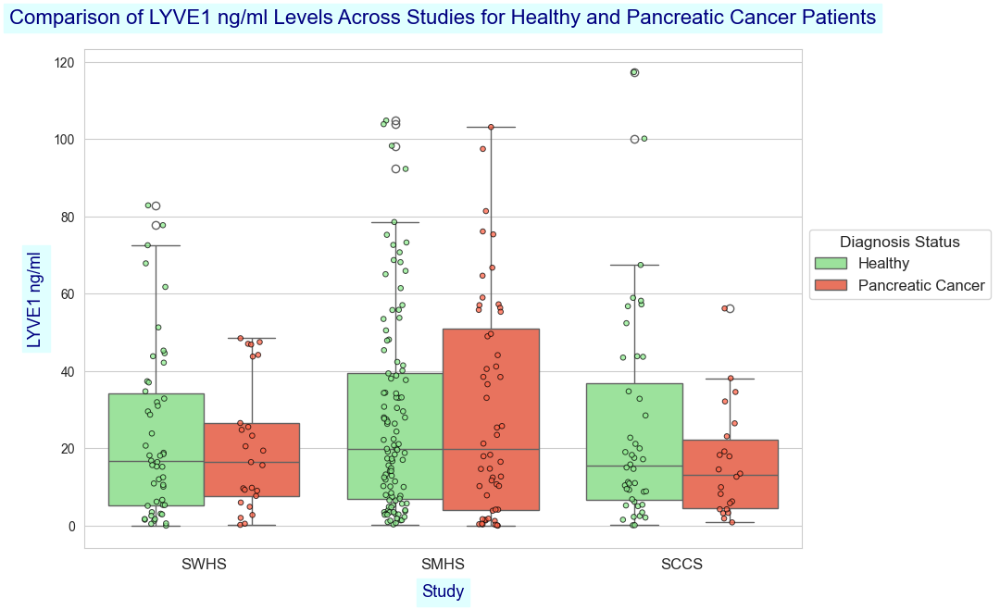

In [114]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of LYVE1 ng/ml Levels Across Studies for Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='STUDY', y='LYVE1 ng/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='STUDY', y='LYVE1 ng/ml', hue='diagnosis', palette=custom_palette, dodge=True,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('LYVE1 ng/ml', fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Study',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(fontsize=12);

- **Feature 4 - TFF1 ng/ml**

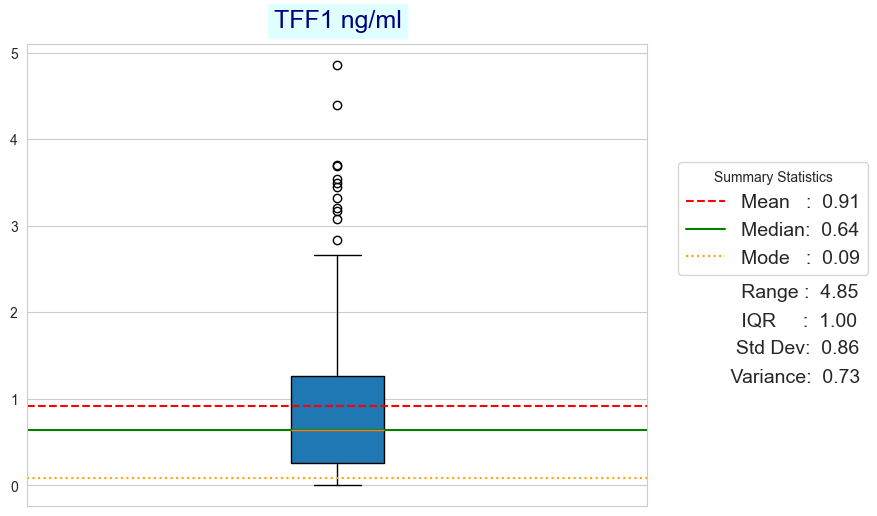

In [116]:
boxplot_with_stats(data, 'TFF1 ng/ml', annotation_start=2.17, annotation_spacing=0.325)

In [117]:
data['TFF1 ng/ml'].max()  # maximum TFF1 ng/ml...

4.858

In [118]:
data['TFF1 ng/ml'].min()  # minimum TFF1 ng/ml...

0.004

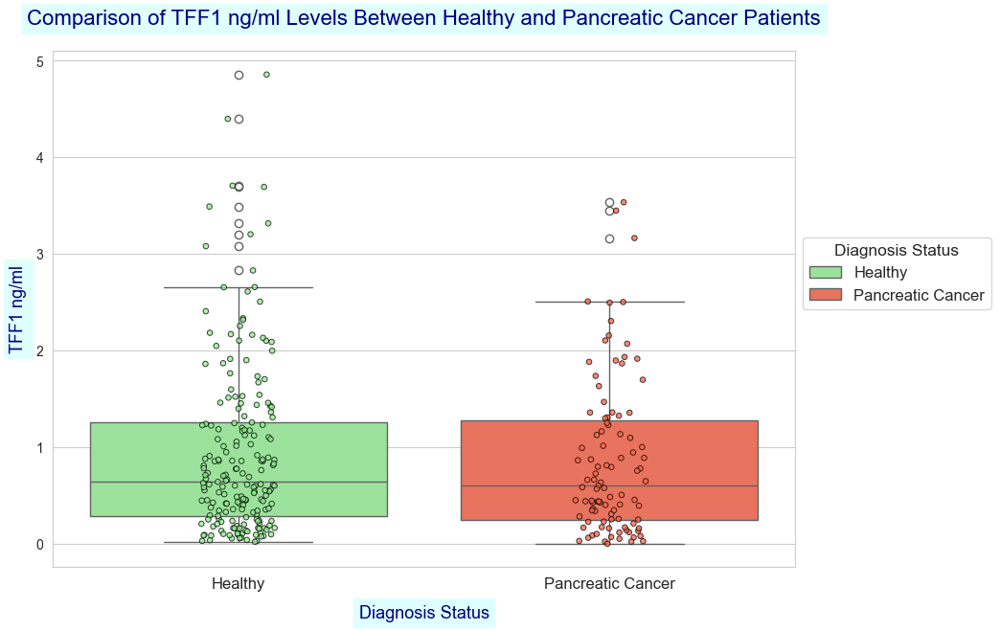

In [119]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of TFF1 ng/ml Levels Between Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='diagnosis', y='TFF1 ng/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='diagnosis', y='TFF1 ng/ml', hue='diagnosis', palette=custom_palette, dodge=False,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('TFF1 ng/ml', fontsize=13, color='navy', backgroundcolor='lightcyan', 
           labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Diagnosis Status',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(ticks=[0, 1], labels=['Healthy', 'Pancreatic Cancer'], fontsize=12);

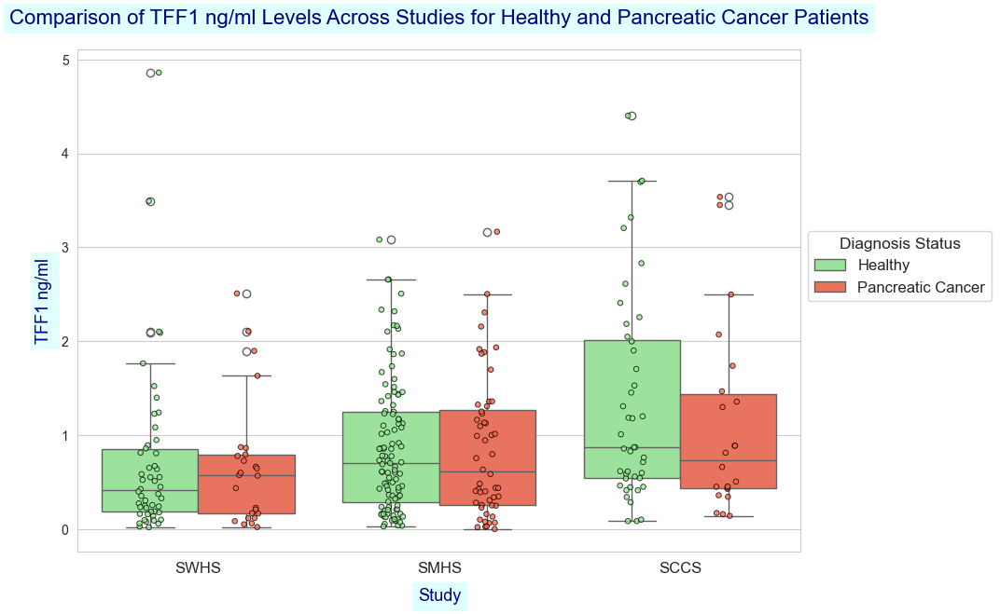

In [120]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of TFF1 ng/ml Levels Across Studies for Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='STUDY', y='TFF1 ng/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='STUDY', y='TFF1 ng/ml', hue='diagnosis', palette=custom_palette, dodge=True,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('TFF1 ng/ml', fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Study',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(fontsize=12);

- **Feature 5 - REG1B ng/ml**

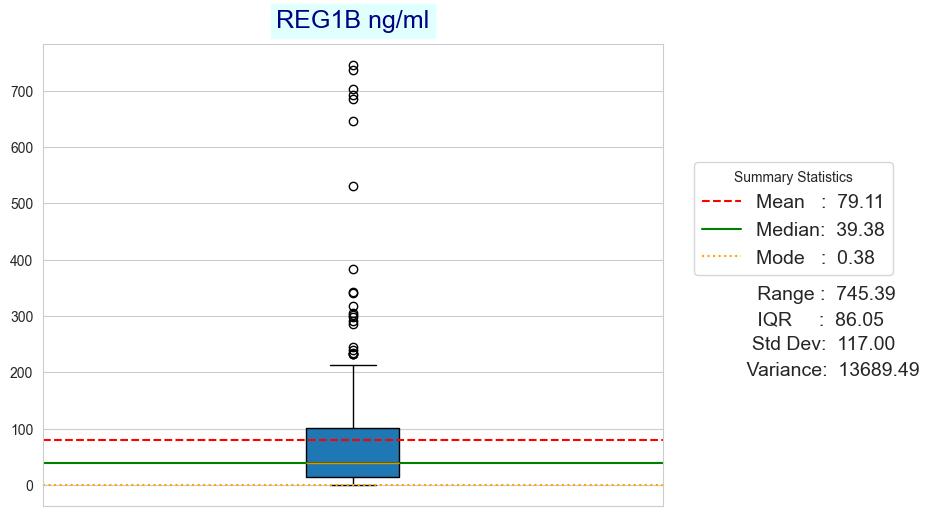

In [122]:
boxplot_with_stats(data, 'REG1B ng/ml', annotation_start=330, annotation_spacing=45)

In [123]:
data['REG1B ng/ml'].max()  # maximum REG1B ng/ml...

745.393

In [124]:
data['REG1B ng/ml'].min()  # minimum REG1B ng/ml...

0.0

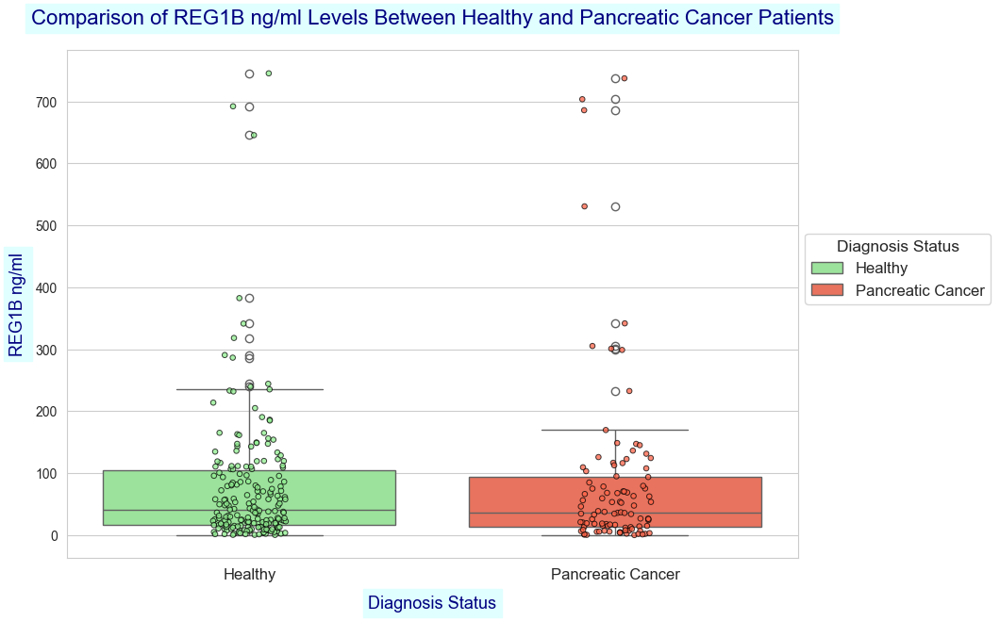

In [125]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of REG1B ng/ml Levels Between Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='diagnosis', y='REG1B ng/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='diagnosis', y='REG1B ng/ml', hue='diagnosis', palette=custom_palette, dodge=False,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('REG1B ng/ml', fontsize=13, color='navy', backgroundcolor='lightcyan', 
           labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Diagnosis Status',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(ticks=[0, 1], labels=['Healthy', 'Pancreatic Cancer'], fontsize=12);

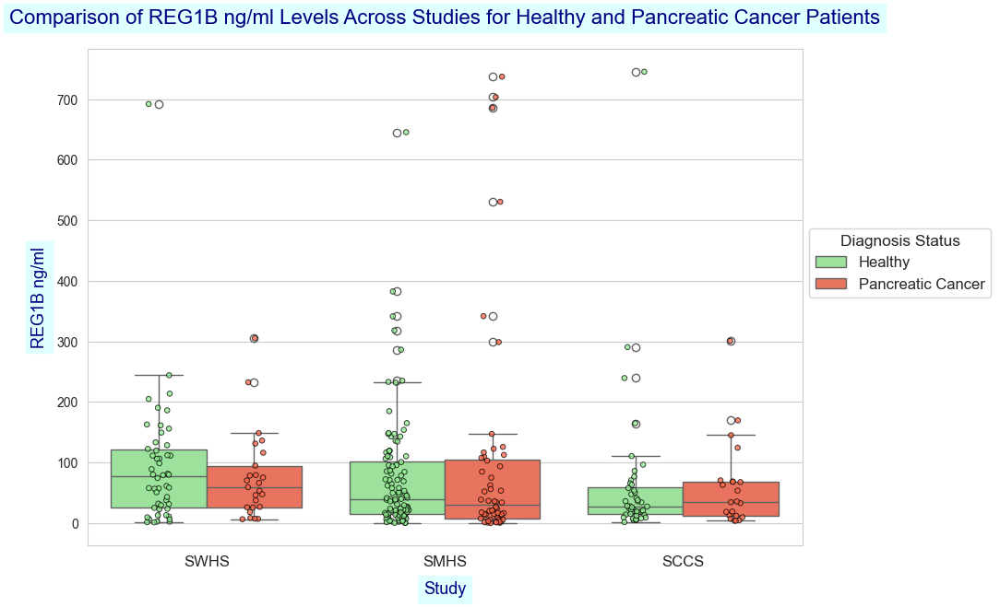

In [126]:
sns.set_style('whitegrid')  # Setting the style of the drawing to --> whitegrid.

                 # (Width, Height)
plt.figure(figsize=(10, 7))  # Setting the Figure Size of our drawing...

# Adding a title to the drawing...
plt.title('Comparison of REG1B ng/ml Levels Across Studies for Healthy and Pancreatic Cancer Patients', fontsize=16, color='navy', 
          backgroundcolor='lightcyan', pad=20)

# making a boxplot drawing...
custom_palette = {0: 'lightgreen', 1: 'tomato'}
ax = sns.boxplot(data, x='STUDY', y='REG1B ng/ml', hue='diagnosis', palette=custom_palette)

sns.stripplot(data=data, x='STUDY', y='REG1B ng/ml', hue='diagnosis', palette=custom_palette, dodge=True,
              size=4, jitter=True, alpha=0.75, legend=False, edgecolor='black', linewidth=0.7)

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Healthy', 'Pancreatic Cancer'],
          title='Diagnosis Status', fontsize=12, title_fontsize=12.5, loc=(1.01, 0.5))

plt.ylabel('REG1B ng/ml', fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=7)   # Adding an y-label to the drawing
plt.xlabel('Study',    fontsize=13, color='navy', backgroundcolor='lightcyan', labelpad=10)  # Adding an x-label to the drawing

# Adjusting the x-axis ticks of the drawing.
plt.xticks(fontsize=12);

- **Feature 6 - diagnosis**

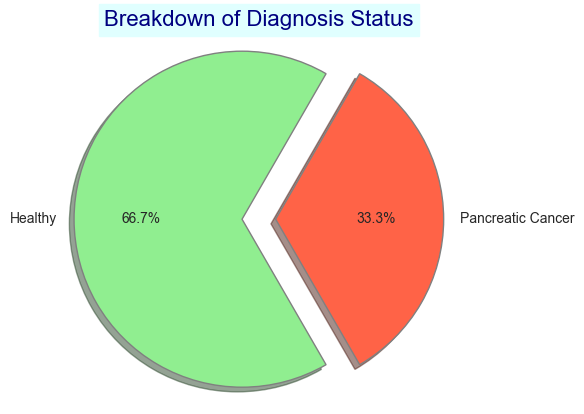

In [128]:
data['diagnosis'].value_counts().plot(kind='pie',
                                      autopct='%1.1f%%',
                                      startangle=60,
                                      shadow=True,
                                      explode=(0.1, 0.1),
                                      wedgeprops={'edgecolor': 'gray'},
                                      colors=['lightgreen', 'tomato'],
                                      labels=['Healthy', 'Pancreatic Cancer'])

# to ensure that the pie chart is drawn with equal aspect ratio, along the x-axis and y-axis, resulting in a circular pie chart...
plt.axis('equal')

# Adding a title to our drawing...
plt.title('Breakdown of Diagnosis Status', fontsize=16, color='navy', backgroundcolor='lightcyan')

plt.ylabel('');  # to remove the y-label (from the drawing)...

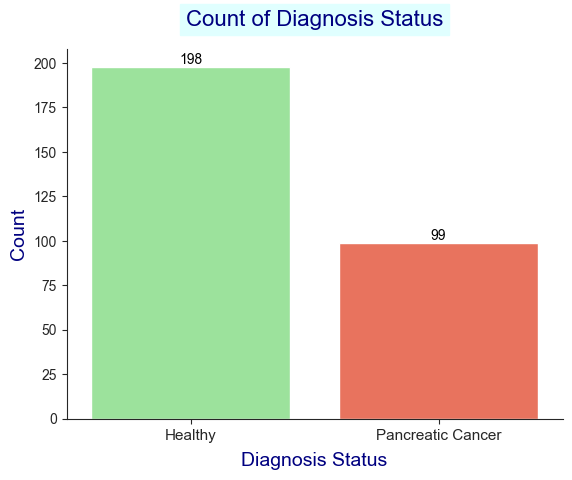

In [129]:
sns.set_style('ticks')  # Setting the style of the drawing to --> ticks style...

# making a count plot drawing...
ax = sns.countplot(data, x='diagnosis', hue='diagnosis', legend=False, palette=custom_palette)

ax.set_xticks([0, 1])
ax.set_xticklabels(['Healthy', 'Pancreatic Cancer'], fontsize=11)

plt.xlabel('Diagnosis Status', fontsize=14, color='navy', labelpad=7)

plt.ylabel('Count', fontsize=14, color='navy')

# Adding a title to our drawing...
plt.title('Count of Diagnosis Status', fontsize=16, color='navy', backgroundcolor='lightcyan', y=1.04)

annotate_bars_vertically(ax)  # Calling the annotate_bars function, to label the bars in the drawing...

sns.despine();  # --> Remove the top and right spines from the drawing...

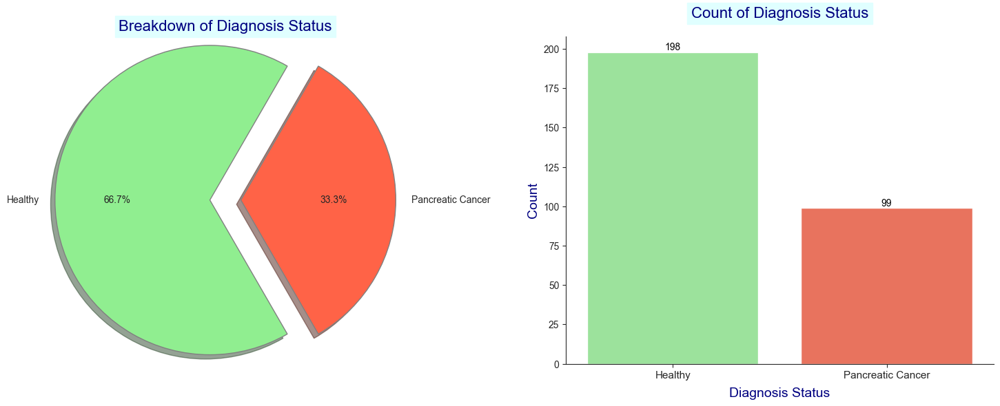

In [130]:
sns.set_style('ticks')

                                     # (Width, Height)
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# 1. Pie Chart Drawing (on the left)
data['diagnosis'].value_counts().plot(kind='pie',
                                      autopct='%1.1f%%',
                                      startangle=60,
                                      shadow=True,
                                      explode=(0.1, 0.1),
                                      wedgeprops={'edgecolor': 'gray'},
                                      colors=['lightgreen', 'tomato'],
                                      labels=['Healthy', 'Pancreatic Cancer'],
                                      ax=axes[0])
axes[0].axis('equal')
axes[0].set_title('Breakdown of Diagnosis Status', fontsize=16, color='navy', backgroundcolor='lightcyan')
axes[0].set_ylabel('')

# 2. Count Plot Drawing (on the right)
ax = sns.countplot(data, x='diagnosis', hue='diagnosis', legend=False, palette=custom_palette, 
                   order=[0, 1], ax=axes[1])
annotate_bars_vertically(ax)
axes[1].set_xticks([0, 1])
axes[1].set_xticklabels(['Healthy', 'Pancreatic Cancer'], fontsize=11)
axes[1].set_xlabel('Diagnosis Status', fontsize=14, color='navy', labelpad=7)
axes[1].set_ylabel('Count', fontsize=14, color='navy')
axes[1].set_title('Count of Diagnosis Status', fontsize=16, color='navy', backgroundcolor='lightcyan', y=1.04)

plt.tight_layout()
sns.despine()
plt.show()

### `Section 6` - Advanced EDA using Dimensionality Reduction Techniques (PCA, t-SNE, UMAP)

- 1 - PCA Scree Plot: Analyzing Variance Explained by Each Principal Component

We used the following input features into our PCA:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


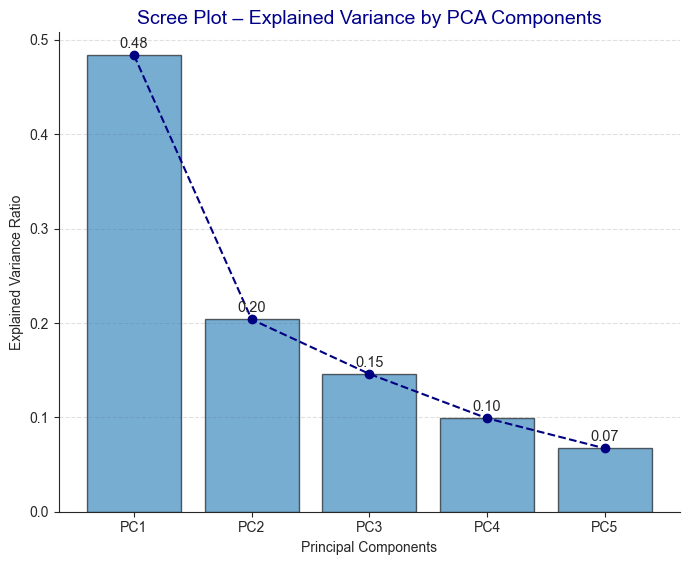

In [133]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# ============================================
# Step 1 – Define the Selected Features
# ============================================
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']

# ========= PRINT MESSAGE BEFORE PROCESSING =========
print("We used the following input features into our PCA:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ============================================
# Step 2 – Prepare the Data
# ============================================
X = data[selected_features].copy()

# ============================================
# Step 3 – Standardize the Features
# ============================================
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ============================================
# Step 4 – Apply PCA (5 components)
# ============================================
pca   = PCA(n_components=5)
X_pca = pca.fit_transform(X_scaled)

# ============================================
# Step 5 – Scree Plot
# ============================================
sns.set_style('ticks')
plt.figure(figsize=(7, 5.75))

explained_var = pca.explained_variance_ratio_

plt.plot(range(1, 6), explained_var, marker='o', linestyle='--', color='navy')
bars = plt.bar(range(1, 6), explained_var, alpha=0.6, edgecolor='black')

# Annotate each bar with its value
for bar in bars:
    height = bar.get_height()
    plt.annotate(f'{height:.2f}', 
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 5),
                 textcoords='offset points',
                 ha='center',
                 fontsize=10.5)

plt.title('Scree Plot – Explained Variance by PCA Components', fontsize=14, color='darkblue')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.xticks(range(1, 6), labels=[f'PC{i}' for i in range(1, 6)])
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
sns.despine()
plt.tight_layout()
plt.show()

- 2 - Cumulative Explained Variance Plot

We used the following input features into our PCA:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


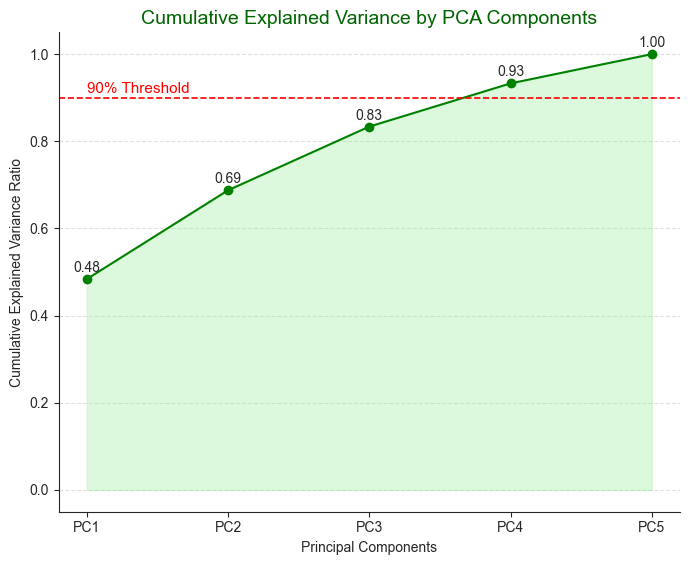

In [135]:
# ========= PRINT MESSAGE BEFORE PLOTTING =========
print("We used the following input features into our PCA:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")
    
# ============================================
# Cumulative Explained Variance Plot
# ============================================
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(7, 5.75))
plt.plot(range(1, 6), cumulative_variance, marker='o', linestyle='-', color='green')
plt.fill_between(range(1, 6), cumulative_variance, alpha=0.3, color='lightgreen')

# Annotate each point
for i, value in enumerate(cumulative_variance):
    plt.annotate(f'{value:.2f}',
                 (i + 1, value),
                 textcoords="offset points",
                 xytext=(0, 5),
                 ha='center',
                 fontsize=10)

# Title and labels
plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, color='darkgreen')
plt.xlabel('Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.xticks(range(1, 6), labels=[f'PC{i}' for i in range(1, 6)])
plt.grid(True, axis='y', linestyle='--', alpha=0.6)

# Horizontal line at 90% threshold 
plt.axhline(y=0.9, color='red', linestyle='--', linewidth=1.2)
plt.text(1, 0.91, '90% Threshold', color='red', fontsize=11)

sns.despine()
plt.tight_layout()
plt.show()

- 3 - PCA Visualization – Side-by-Side Scree Plot and Cumulative Explained Variance

We used the following input features into our PCA:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


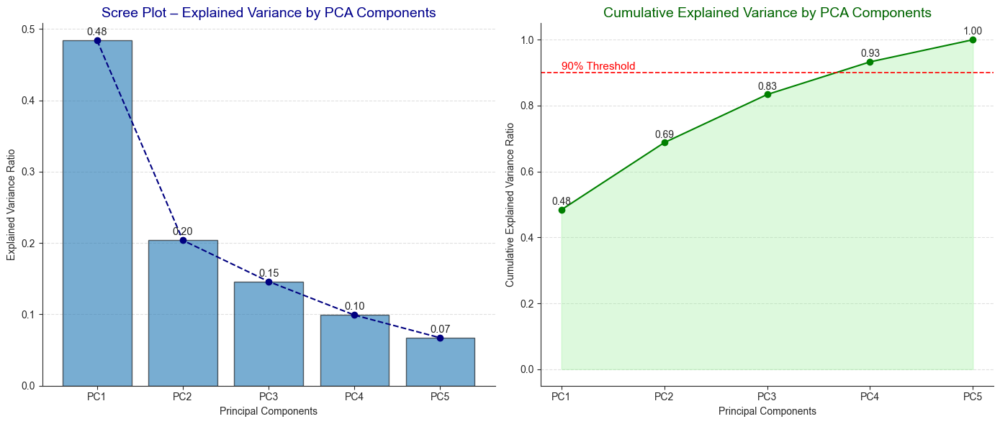

In [137]:
# ========= PRINT MESSAGE BEFORE PLOTTING =========
print("We used the following input features into our PCA:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")
    
# ============================================
# Prepare Explained & Cumulative Variance
# ============================================
explained_var  = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

# ============================================
# Plot Scree + Cumulative Side by Side
# ============================================
sns.set_style('ticks')
fig, axes = plt.subplots(1, 2, figsize=(14, 6)) 

# -------------------
# 1. Scree Plot (Left)
# -------------------
axes[0].plot(range(1, 6), explained_var, marker='o', linestyle='--', color='navy')
bars = axes[0].bar(range(1, 6), explained_var, alpha=0.6, edgecolor='black')

# Annotate each bar
for bar in bars:
    height = bar.get_height()
    axes[0].annotate(f'{height:.2f}', 
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 5),
                     textcoords='offset points',
                     ha='center',
                     fontsize=10.5)

axes[0].set_title('Scree Plot – Explained Variance by PCA Components', fontsize=14, color='darkblue')
axes[0].set_xlabel('Principal Components')
axes[0].set_ylabel('Explained Variance Ratio')
axes[0].set_xticks(range(1, 6))
axes[0].set_xticklabels([f'PC{i}' for i in range(1, 6)])
axes[0].grid(True, axis='y', linestyle='--', alpha=0.6)

# -----------------------------
# 2. Cumulative Variance (Right)
# -----------------------------
axes[1].plot(range(1, 6), cumulative_var, marker='o', linestyle='-', color='green')
axes[1].fill_between(range(1, 6), cumulative_var, alpha=0.3, color='lightgreen')

# Annotate each point
for i, value in enumerate(cumulative_var):
    axes[1].annotate(f'{value:.2f}', 
                     (i + 1, value),
                     textcoords="offset points",
                     xytext=(0, 5),
                     ha='center',
                     fontsize=10)

axes[1].set_title('Cumulative Explained Variance by PCA Components', fontsize=14, color='darkgreen')
axes[1].set_xlabel('Principal Components')
axes[1].set_ylabel('Cumulative Explained Variance Ratio')
axes[1].set_xticks(range(1, 6))
axes[1].set_xticklabels([f'PC{i}' for i in range(1, 6)])
axes[1].axhline(y=0.9, color='red', linestyle='--', linewidth=1.2)
axes[1].text(1, 0.91, '90% Threshold', color='red', fontsize=11)
axes[1].grid(True, axis='y', linestyle='--', alpha=0.6)

sns.despine()
plt.tight_layout()
plt.show()

- 4

We used the following input features into our PCA:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


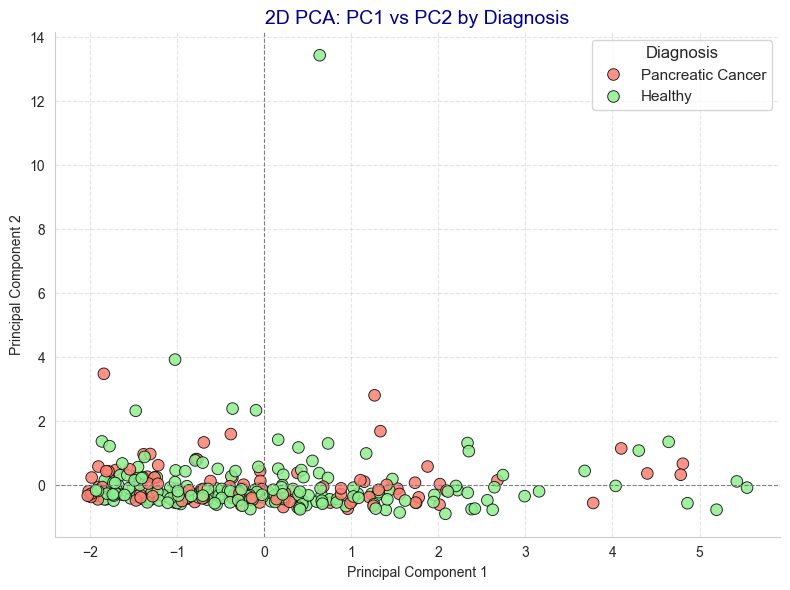

In [139]:
# ========== SETUP ==========
sns.set_style('whitegrid')
palette = ['salmon', 'lightgreen']

# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our PCA:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_pca  = data.copy()
diagnosis = data_pca['diagnosis']  # Target/hue

# Extract selected features
X = data_pca[selected_features].copy()

# ========== SCALE & APPLY PCA ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca   = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Create DataFrame for plotting
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Diagnosis'] = diagnosis.values
pca_df['Diagnosis'] = pca_df['Diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})

# ========== PLOT ==========
plt.figure(figsize=(8, 6))

sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85)

plt.title('2D PCA: PC1 vs PC2 by Diagnosis', fontsize=14, color='darkblue')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)
plt.axvline(0, color='gray', linestyle='--', linewidth=0.8)
plt.grid(True, linestyle='--', alpha=0.5)

plt.legend(title='Diagnosis', fontsize=11, title_fontsize=12)
sns.despine()
plt.tight_layout()
plt.show()

- 5

We used the following input features into our PCA and t-SNE:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


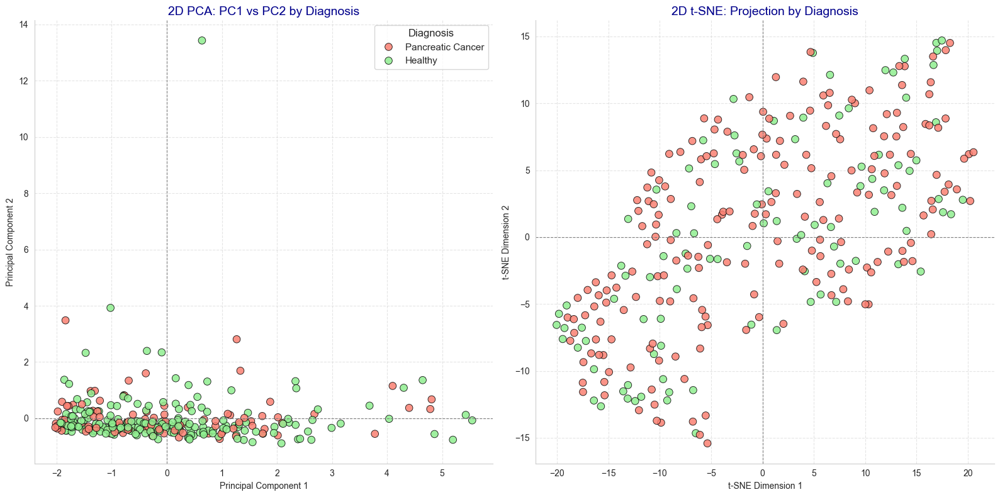

In [141]:
from sklearn.manifold import TSNE

# ========== SETUP ==========
sns.set_style('whitegrid')
palette = ['salmon', 'lightgreen']

# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our PCA and t-SNE:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy  = data.copy()
diagnosis  = data_copy['diagnosis']  # Target for hue

X = data_copy[selected_features].copy()

# ========== SCALE THE DATA ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== APPLY PCA ==========
pca   = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=['Dim1', 'Dim2'])
pca_df['Diagnosis'] = diagnosis.values
pca_df['Diagnosis'] = pca_df['Diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})

# ========== APPLY t-SNE ==========
tsne   = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(X_tsne, columns=['Dim1', 'Dim2'])
tsne_df['Diagnosis'] = diagnosis.values

# ========== PLOT SIDE-BY-SIDE ==========
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# PCA Plot
sns.scatterplot(data=pca_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[0])
axes[0].set_title('2D PCA: PC1 vs PC2 by Diagnosis', fontsize=14, color='darkblue')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[0].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[0].grid(True, linestyle='--', alpha=0.5)
axes[0].legend(title='Diagnosis', fontsize=11, title_fontsize=12)

# t-SNE Plot
sns.scatterplot(data=tsne_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[1])
axes[1].set_title('2D t-SNE: Projection by Diagnosis', fontsize=14, color='darkblue')
axes[1].set_xlabel('t-SNE Dimension 1')
axes[1].set_ylabel('t-SNE Dimension 2')
axes[1].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[1].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[1].grid(True, linestyle='--', alpha=0.5)
axes[1].legend().remove()

sns.despine()
plt.tight_layout()
plt.show()

- 6

We used the following input features into our PCA, t-SNE, and UMAP:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


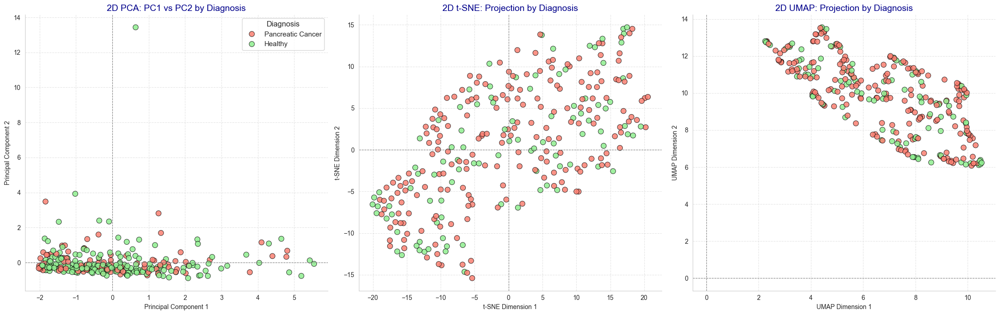

In [143]:
import umap

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="umap")

# ========== SETUP ==========
sns.set_style('whitegrid')
palette = ['salmon', 'lightgreen']

# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our PCA, t-SNE, and UMAP:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
diagnosis = data_copy['diagnosis']

X = data_copy[selected_features].copy()

# ========== SCALE THE DATA ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== APPLY DIMENSIONALITY REDUCTION ==========
# PCA
pca    = PCA(n_components=2, random_state=42)
X_pca  = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=['Dim1', 'Dim2'])
pca_df['Diagnosis'] = diagnosis.values
pca_df['Diagnosis'] = pca_df['Diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})

# t-SNE
tsne    = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne  = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(X_tsne, columns=['Dim1', 'Dim2'])
tsne_df['Diagnosis'] = diagnosis.values

# UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap     = umap_model.fit_transform(X_scaled)
umap_df    = pd.DataFrame(X_umap, columns=['Dim1', 'Dim2'])
umap_df['Diagnosis'] = diagnosis.values

# ========== PLOT SIDE-BY-SIDE ==========
fig, axes = plt.subplots(1, 3, figsize=(22, 7))

# PCA
sns.scatterplot(data=pca_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[0])
axes[0].set_title('2D PCA: PC1 vs PC2 by Diagnosis', fontsize=14, color='darkblue')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[0].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[0].grid(True, linestyle='--', alpha=0.5)
axes[0].legend(title='Diagnosis', fontsize=11, title_fontsize=12)

# t-SNE
sns.scatterplot(data=tsne_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[1])
axes[1].set_title('2D t-SNE: Projection by Diagnosis', fontsize=14, color='darkblue')
axes[1].set_xlabel('t-SNE Dimension 1')
axes[1].set_ylabel('t-SNE Dimension 2')
axes[1].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[1].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[1].grid(True, linestyle='--', alpha=0.5)
axes[1].legend_.remove()

# UMAP
sns.scatterplot(data=umap_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[2])
axes[2].set_title('2D UMAP: Projection by Diagnosis', fontsize=14, color='darkblue')
axes[2].set_xlabel('UMAP Dimension 1')
axes[2].set_ylabel('UMAP Dimension 2')
axes[2].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[2].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[2].grid(True, linestyle='--', alpha=0.5)
axes[2].legend_.remove()

sns.despine()
plt.tight_layout()
plt.show()

- 7

We used the following input features for PCA, t-SNE, and UMAP tuning:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


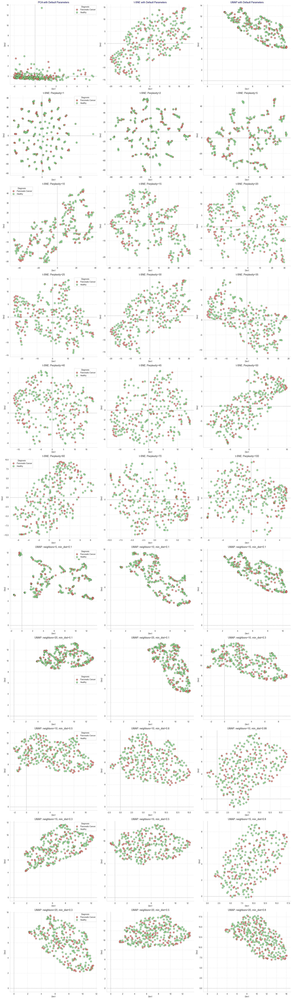

In [145]:
# ============================================
# 1. Data Preparation – 5 Biomarkers
# ============================================

selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features for PCA, t-SNE, and UMAP tuning:")
for i, feature in enumerate(selected_features, 1):
    print(f"{i}) {feature}")

# Prepare data
data_copy = data.copy()
X = data_copy[selected_features].copy()
y = data_copy['diagnosis']

# Standardize features
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ============================================
# 2. PCA – Baseline
# ============================================

pca   = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# ============================================
# 3. t-SNE & UMAP Hyperparameter Ranges
# ============================================

tsne_perplexities = [1, 2, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 100]
umap_configs = [
    (5, 0.1), (10, 0.1), (15, 0.1), (20, 0.1), (25, 0.1),
    (10, 0.3), (10, 0.5), (10, 0.8), (10, 0.99),
    (15, 0.3), (15, 0.5), (15, 0.8),
    (20, 0.3), (20, 0.5), (20, 0.8)
]

# ============================================
# 4. Plotting All in 11 Rows × 3 Columns
# ============================================

sns.set_style('whitegrid')
palette = ['salmon', 'lightgreen']

fig, axes = plt.subplots(11, 3, figsize=(22, 75))
fig.subplots_adjust(hspace=0.4)

# Row 0: Baseline – PCA, t-SNE, UMAP
titles = ['PCA with Default Parameters',
          't-SNE with Default Parameters',
          'UMAP with Default Parameters']

methods = [
    X_pca,
    TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X_scaled),
    umap.UMAP(n_components=2, random_state=42).fit_transform(X_scaled)
]

for i, (ax, title, embedding) in enumerate(zip(axes[0], titles, methods)):
    df = pd.DataFrame(embedding, columns=['Dim1', 'Dim2'])
    df['Diagnosis'] = y.values
    df['Diagnosis'] = df['Diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})
    sns.scatterplot(data=df, x='Dim1', y='Dim2', hue='Diagnosis', palette=palette,
                    s=70, edgecolor='black', alpha=0.85, ax=ax)
    ax.set_title(title, fontsize=13, color='darkblue')
    ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if i != 0:
        ax.legend_.remove()

# Rows 1–5: t-SNE – Different Perplexities
for idx, perplexity in enumerate(tsne_perplexities):
    row = 1 + idx // 3
    col = idx % 3
    tsne_model = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    X_tsne = tsne_model.fit_transform(X_scaled)
    df = pd.DataFrame(X_tsne, columns=['Dim1', 'Dim2'])
    df['Diagnosis'] = y.values
    df['Diagnosis'] = df['Diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})
    ax = axes[row][col]
    sns.scatterplot(data=df, x='Dim1', y='Dim2', hue='Diagnosis', palette=palette,
                    s=70, edgecolor='black', alpha=0.85, ax=ax)
    ax.set_title(f't-SNE: Perplexity={perplexity}', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if col != 0:
        ax.legend_.remove()

# Rows 6–10: UMAP – Different Configurations
for idx, (n_neighbors, min_dist) in enumerate(umap_configs):
    row = 6 + idx // 3
    col = idx % 3
    reducer = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
    X_umap = reducer.fit_transform(X_scaled)
    df = pd.DataFrame(X_umap, columns=['Dim1', 'Dim2'])
    df['Diagnosis'] = y.values
    df['Diagnosis'] = df['Diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})
    ax = axes[row][col]
    sns.scatterplot(data=df, x='Dim1', y='Dim2', hue='Diagnosis', palette=palette,
                    s=70, edgecolor='black', alpha=0.85, ax=ax)
    ax.set_title(f'UMAP: neighbors={n_neighbors}, min_dist={min_dist}', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if col != 0:
        ax.legend_.remove()

# Final layout
sns.despine()
plt.tight_layout()
plt.show()

- 8

We used the following input features into our PCA, t-SNE, and UMAP:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


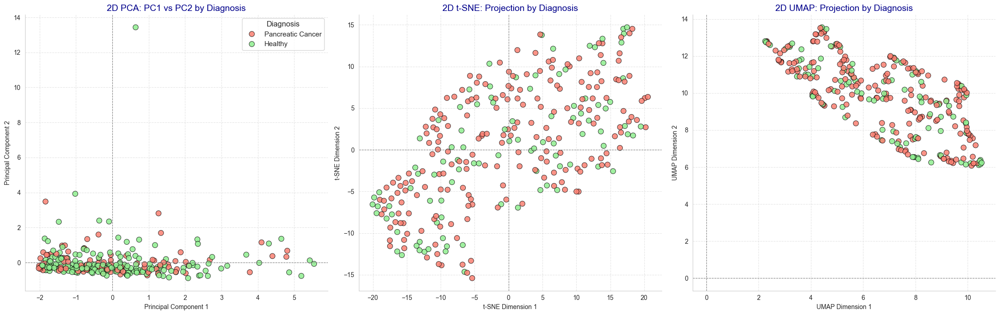

In [147]:
import umap

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="umap")

# ========== SETUP ==========
sns.set_style('whitegrid')
palette = ['salmon', 'lightgreen']

# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our PCA, t-SNE, and UMAP:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
diagnosis = data_copy['diagnosis']

X = data_copy[selected_features].copy()

# ========== SCALE THE DATA ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== APPLY DIMENSIONALITY REDUCTION ==========
# PCA
pca    = PCA(n_components=2, random_state=42)
X_pca  = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=['Dim1', 'Dim2'])
pca_df['Diagnosis'] = diagnosis.values
pca_df['Diagnosis'] = pca_df['Diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})

# t-SNE
tsne    = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne  = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(X_tsne, columns=['Dim1', 'Dim2'])
tsne_df['Diagnosis'] = diagnosis.values

# UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap     = umap_model.fit_transform(X_scaled)
umap_df    = pd.DataFrame(X_umap, columns=['Dim1', 'Dim2'])
umap_df['Diagnosis'] = diagnosis.values

# ========== PLOT SIDE-BY-SIDE ==========
fig, axes = plt.subplots(1, 3, figsize=(22, 7))

# PCA
sns.scatterplot(data=pca_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[0])
axes[0].set_title('2D PCA: PC1 vs PC2 by Diagnosis', fontsize=14, color='darkblue')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[0].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[0].grid(True, linestyle='--', alpha=0.5)
axes[0].legend(title='Diagnosis', fontsize=11, title_fontsize=12)

# t-SNE
sns.scatterplot(data=tsne_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[1])
axes[1].set_title('2D t-SNE: Projection by Diagnosis', fontsize=14, color='darkblue')
axes[1].set_xlabel('t-SNE Dimension 1')
axes[1].set_ylabel('t-SNE Dimension 2')
axes[1].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[1].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[1].grid(True, linestyle='--', alpha=0.5)
axes[1].legend_.remove()

# UMAP
sns.scatterplot(data=umap_df, x='Dim1', y='Dim2', hue='Diagnosis',
                palette=palette, s=70, edgecolor='black', alpha=0.85, ax=axes[2])
axes[2].set_title('2D UMAP: Projection by Diagnosis', fontsize=14, color='darkblue')
axes[2].set_xlabel('UMAP Dimension 1')
axes[2].set_ylabel('UMAP Dimension 2')
axes[2].axhline(0, color='gray', linestyle='--', linewidth=0.8)
axes[2].axvline(0, color='gray', linestyle='--', linewidth=0.8)
axes[2].grid(True, linestyle='--', alpha=0.5)
axes[2].legend_.remove()

sns.despine()
plt.tight_layout()
plt.show()

- 9

We used the following input features into our PCA, t-SNE, and UMAP:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


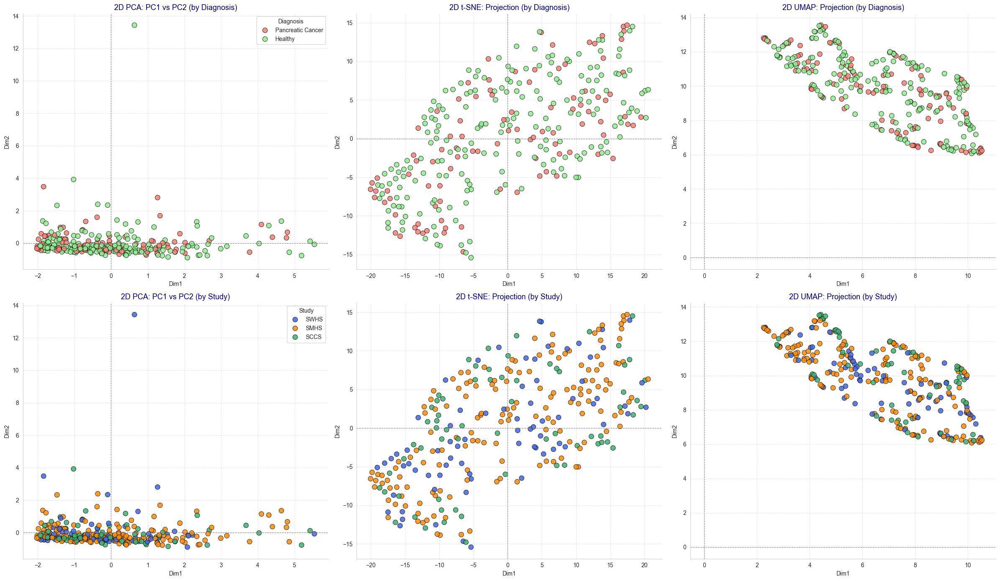

In [149]:
# ========== SETUP ==========
sns.set_style('whitegrid')
palette_diagnosis = ['salmon', 'lightgreen']
palette_study     = ['royalblue', 'darkorange', 'mediumseagreen']

# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our PCA, t-SNE, and UMAP:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy  = data.copy()
diagnosis  = data_copy['diagnosis'].map({0: 'Healthy', 1: 'Pancreatic Cancer'})
study      = data_copy['STUDY']  
X          = data_copy[selected_features].copy()

# ========== SCALE ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== APPLY DIMENSIONALITY REDUCTION ==========
# PCA
pca   = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# t-SNE
tsne   = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap     = umap_model.fit_transform(X_scaled)

# ========== PLOT – 2 Rows × 3 Columns ==========
fig, axes = plt.subplots(2, 3, figsize=(24, 14))
fig.subplots_adjust(hspace=0.3, wspace=0.3)

titles = ['2D PCA: PC1 vs PC2', '2D t-SNE: Projection', '2D UMAP: Projection']

# ---- Top Row: Colored by Diagnosis ----
for i, (ax, title, emb) in enumerate(zip(axes[0], titles, [X_pca, X_tsne, X_umap])):
    df = pd.DataFrame(emb, columns=['Dim1', 'Dim2'])
    df['Diagnosis'] = diagnosis.values
    sns.scatterplot(data=df, x='Dim1', y='Dim2', hue='Diagnosis', palette=palette_diagnosis,
                    s=70, edgecolor='black', alpha=0.85, ax=ax)
    ax.set_title(f'{title} (by Diagnosis)', fontsize=13, color='darkblue')
    ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if i != 0:
        ax.legend_.remove()

# ---- Bottom Row: Colored by Study (Cohort) ----
for i, (ax, title, emb) in enumerate(zip(axes[1], titles, [X_pca, X_tsne, X_umap])):
    df = pd.DataFrame(emb, columns=['Dim1', 'Dim2'])
    df['Study'] = study.values
    sns.scatterplot(data=df, x='Dim1', y='Dim2', hue='Study', palette=palette_study,
                    s=70, edgecolor='black', alpha=0.85, ax=ax)
    ax.set_title(f'{title} (by Study)', fontsize=13, color='darkblue')
    ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if i != 0:
        ax.legend_.remove()

sns.despine()
plt.tight_layout()
plt.show()

- 10 - Diagnosis

In [151]:
# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our 3D PCA:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
data_copy["diagnosis_str"] = data_copy["diagnosis"].map({0: 'Healthy', 1: 'Pancreatic Cancer'})

X = data_copy[selected_features].copy()
y = data_copy["diagnosis_str"]

# ========== SCALE ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== PCA (3D) ==========
pca      = PCA(n_components=3, random_state=42)
X_pca_3d = pca.fit_transform(X_scaled)

# ========== Create DataFrame ==========
pca_df = pd.DataFrame(X_pca_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df['Diagnosis'] = y.values

# ========== Plotly 3D Scatter ==========
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Diagnosis',
                    title='3D PCA: PC1 vs PC2 vs PC3 Colored by Diagnosis',
                    color_discrete_map={'Healthy': 'lightgreen', 'Pancreatic Cancer': 'salmon'})

fig.update_layout(
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    ),
    width=1000,
    height=700,
    legend_title_text='Diagnosis'
)

fig.update_traces(marker=dict(opacity=0.75))

# ========== Show Plot ==========
fig.show()

# ========== Drop Helper Column ==========
data_copy.drop(columns=["diagnosis_str"], inplace=True)

We used the following input features into our 3D PCA:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


- 11 - Diagnosis

In [153]:
# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our 3D t-SNE:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
data_copy["diagnosis_str"] = data_copy["diagnosis"].map({0: 'Healthy', 1: 'Pancreatic Cancer'})

X = data_copy[selected_features].copy()
y = data_copy["diagnosis_str"]

# ========== SCALE ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== t-SNE (3D) ==========
tsne       = TSNE(n_components=3, random_state=42)
X_tsne_3d  = tsne.fit_transform(X_scaled)

# ========== Create DataFrame ==========
tsne_df = pd.DataFrame(X_tsne_3d, columns=['Dim1', 'Dim2', 'Dim3'])
tsne_df['Diagnosis'] = y.values

# ========== Plotly 3D Scatter ==========
fig = px.scatter_3d(tsne_df,
                    x='Dim1',
                    y='Dim2',
                    z='Dim3',
                    color='Diagnosis',
                    title='3D t-SNE: Projection Colored by Diagnosis',
                    color_discrete_map={'Healthy': 'lightgreen', 'Pancreatic Cancer': 'salmon'})

fig.update_layout(
    scene=dict(
        xaxis_title='t-SNE Dimension 1',
        yaxis_title='t-SNE Dimension 2',
        zaxis_title='t-SNE Dimension 3'
    ),
    width=1000,
    height=700,
    legend_title_text='Diagnosis'
)

fig.update_traces(marker=dict(opacity=0.75))

# ========== Show Plot ==========
fig.show()

# ========== Drop Helper Column ==========
data_copy.drop(columns=["diagnosis_str"], inplace=True)

We used the following input features into our 3D t-SNE:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


- 12 - Diagnosis

In [155]:
# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our 3D UMAP:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
data_copy["diagnosis_str"] = data_copy["diagnosis"].map({0: 'Healthy', 1: 'Pancreatic Cancer'})

X = data_copy[selected_features].copy()
y = data_copy["diagnosis_str"]

# ========== SCALE ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== UMAP (3D) ==========
umap_model = umap.UMAP(n_components=3, random_state=42)
X_umap_3d  = umap_model.fit_transform(X_scaled)

# ========== Create DataFrame ==========
umap_df = pd.DataFrame(X_umap_3d, columns=['Dim1', 'Dim2', 'Dim3'])
umap_df['Diagnosis'] = y.values

# ========== Plotly 3D Scatter ==========
fig = px.scatter_3d(umap_df,
                    x='Dim1',
                    y='Dim2',
                    z='Dim3',
                    color='Diagnosis',
                    title='3D UMAP: Projection Colored by Diagnosis',
                    color_discrete_map={'Healthy': 'lightgreen', 'Pancreatic Cancer': 'salmon'})

fig.update_layout(
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3'
    ),
    width=1000,
    height=700,
    legend_title_text='Diagnosis'
)

fig.update_traces(marker=dict(opacity=0.75))

# ========== Show Plot ==========
fig.show()

# ========== Drop Helper Column ==========
data_copy.drop(columns=["diagnosis_str"], inplace=True)

We used the following input features into our 3D UMAP:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


- 13 - Study

In [157]:
# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our 3D PCA:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
study     = data_copy["STUDY"]  

X = data_copy[selected_features].copy()

# ========== SCALE ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== PCA (3D) ==========
pca      = PCA(n_components=3, random_state=42)
X_pca_3d = pca.fit_transform(X_scaled)

# ========== Create DataFrame ==========
pca_df = pd.DataFrame(X_pca_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df['Study'] = study.values

# ========== Plotly 3D Scatter ==========
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Study',
                    title='3D PCA: PC1 vs PC2 vs PC3 Colored by Study',
                    color_discrete_map={'SWHS': 'royalblue', 'SMHS': 'darkorange', 'SCCS': 'mediumseagreen'})

fig.update_layout(
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    ),
    width=1000,
    height=700,
    legend_title_text='Study'
)

fig.update_traces(marker=dict(opacity=0.75))

# ========== Show Plot ==========
fig.show()

We used the following input features into our 3D PCA:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


- 14 - Study

In [159]:
# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our 3D t-SNE:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
study     = data_copy["STUDY"]  

X = data_copy[selected_features].copy()

# ========== SCALE ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== t-SNE (3D) ==========
tsne       = TSNE(n_components=3, random_state=42)
X_tsne_3d  = tsne.fit_transform(X_scaled)

# ========== Create DataFrame ==========
tsne_df = pd.DataFrame(X_tsne_3d, columns=['Dim1', 'Dim2', 'Dim3'])
tsne_df['Study'] = study.values

# ========== Plotly 3D Scatter ==========
fig = px.scatter_3d(tsne_df,
                    x='Dim1',
                    y='Dim2',
                    z='Dim3',
                    color='Study',
                    title='3D t-SNE: Projection Colored by Study',
                    color_discrete_map={'SWHS': 'royalblue', 'SMHS': 'darkorange', 'SCCS': 'mediumseagreen'})

fig.update_layout(
    scene=dict(
        xaxis_title='t-SNE Dimension 1',
        yaxis_title='t-SNE Dimension 2',
        zaxis_title='t-SNE Dimension 3'
    ),
    width=1000,
    height=700,
    legend_title_text='Study'
)

fig.update_traces(marker=dict(opacity=0.75))

# ========== Show Plot ==========
fig.show()

We used the following input features into our 3D t-SNE:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


- 15 - Study

In [161]:
# ========== SELECTED FEATURES ==========
selected_features = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']
print("We used the following input features into our 3D UMAP:")
for i, feature in enumerate(selected_features, start=1):
    print(f"{i}) {feature}")

# ========== PREPARE DATA ==========
data_copy = data.copy()
study     = data_copy["STUDY"] 

X = data_copy[selected_features].copy()

# ========== SCALE ==========
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== UMAP (3D) ==========
umap_model = umap.UMAP(n_components=3, random_state=42)
X_umap_3d  = umap_model.fit_transform(X_scaled)

# ========== Create DataFrame ==========
umap_df = pd.DataFrame(X_umap_3d, columns=['Dim1', 'Dim2', 'Dim3'])
umap_df['Study'] = study.values

# ========== Plotly 3D Scatter ==========
fig = px.scatter_3d(umap_df,
                    x='Dim1',
                    y='Dim2',
                    z='Dim3',
                    color='Study',
                    title='3D UMAP: Projection Colored by Study',
                    color_discrete_map={'SWHS': 'royalblue', 'SMHS': 'darkorange', 'SCCS': 'mediumseagreen'})

fig.update_layout(
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3'
    ),
    width=1000,
    height=700,
    legend_title_text='Study'
)

fig.update_traces(marker=dict(opacity=0.75))

# ========== Show Plot ==========
fig.show()

We used the following input features into our 3D UMAP:
1) CA19-9 U/ml
2) Creatinine grams/L
3) LYVE1 ng/ml
4) TFF1 ng/ml
5) REG1B ng/ml


### `Section 7` - Removing Irrelevant Columns - `Part 2`

- 1

In [164]:
data.head(1)

,STUDY,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml,diagnosis
0,SWHS,92.87,0.2,2.764,0.026,25.693,1


- 2

In [166]:
# Dropping the `STUDY` column because it represents the cohort or study group each sample came from (e.g., SWHS, SMHS, SCCS).
# This column is not a biological or clinical feature, and it does not provide any meaningful information about the disease itself.
# Keeping it could lead to bias or misleading patterns in the model, as the model might learn to associate the outcome with the study source instead of real medical indicators.

data = data.drop(columns=['STUDY'])  # dropping the `STUDY` column...

- 3

In [168]:
data.head(1)

,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml,diagnosis
0,92.87,0.2,2.764,0.026,25.693,1


### `Section 8` - Splitting the Data into Training and Testing Sets

- 1

In [171]:
# Separating the features (X) and the target variable (y)

X = data.drop('diagnosis', axis=1)  # X --> Contains all independent features
y = data['diagnosis']               # y --> Contains the target variable (dependent feature)

- 2

In [173]:
from sklearn.model_selection import train_test_split

# Splitting the data into training and testing portions...
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2,   # Splitting the dataset into training (80%) and testing (20%) sets. 
                                                    stratify=y,      # Preserve class distribution
                                                    random_state=42  # Setting a fixed random state to ensure reproducibility of the split.
)

- 3

In [175]:
# Checking the shape (number of rows and columns) of the training and testing sets...
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((237, 5), (60, 5), (237,), (60,))

### `Section 9` - Feature Scaling

- 1

In [178]:
X_train.head()

,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
190,27.59,0.23,10.240,0.342,3.141
214,11.05,1.27,47.877,0.203,95.811
220,13.86,0.85,26.396,0.616,38.840
22,9.55,0.85,16.458,4.858,80.153
12,11.26,0.59,38.462,1.232,109.407


- 2

In [180]:
from sklearn.preprocessing import StandardScaler

# ========== STEP 1: Define the columns to scale ==========
columns_to_scale = ['CA19-9 U/ml', 'Creatinine grams/L', 'LYVE1 ng/ml', 'TFF1 ng/ml', 'REG1B ng/ml']

# ========== STEP 2: Copy the original datasets ==========
X_train_scaled = X_train.copy()
X_test_scaled  = X_test.copy()

# ========== STEP 3: Fit the scaler only on training data ==========
scaler = StandardScaler()
X_train_scaled[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])

# ========== STEP 4: Transform test data using the same scaler ==========
X_test_scaled[columns_to_scale] = scaler.transform(X_test[columns_to_scale])

- 3

In [182]:
X_train_scaled.head()

,CA19-9 U/ml,Creatinine grams/L,LYVE1 ng/ml,TFF1 ng/ml,REG1B ng/ml
190,0.372520,-1.170356,-0.644305,-0.669185,-0.631794
214,-0.334938,0.562713,0.909517,-0.830732,0.106938
220,-0.214747,-0.137180,0.022687,-0.350738,-0.347215
22,-0.399097,-0.137180,-0.387598,4.579369,-0.017882
12,-0.325956,-0.570447,0.520825,0.365185,0.215320


### `Section 10` - Model Selection

- 1

In [185]:
y_train.value_counts()

diagnosis
0    158
1     79
Name: count, dtype: int64

In [186]:
y_test.value_counts()

diagnosis
0    40
1    20
Name: count, dtype: int64

- 2 - Small Neural Network

In [188]:
import random
import tensorflow as tf

# Setting a fixed seed value to ensure reproducibility of the results
SEED = 42

np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

In [189]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from scikeras.wrappers import KerasClassifier

def create_small_ann(input_shape):
    
    model = Sequential()

    model.add(Input(shape=(input_shape,)))
    
    model.add(Dense(8, activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(4,  activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1,  activation='sigmoid'))

    # Compiling the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

- 3 - Medium Neural Network

In [191]:
def create_medium_ann(input_shape):
    
    model = Sequential()

    model.add(Input(shape=(input_shape,)))
    
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(16, activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(8,  activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1,  activation='sigmoid'))

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

- 4 - Large Neural Network

In [193]:
def create_large_ann(input_shape):
    
    model = Sequential()

    model.add(Input(shape=(input_shape,)))

    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(64,  activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(32,  activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(16,  activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(8,   activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1,   activation='sigmoid'))

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

- 5

In [195]:
import warnings  # Importing the warnings module to manage warning messages
warnings.filterwarnings("ignore", category=UserWarning, module='keras')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')

In [198]:
from sklearn.linear_model import Perceptron, LogisticRegression, RidgeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, ExtraTreesClassifier, VotingClassifier, StackingClassifier, HistGradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from tabpfn import TabPFNClassifier
from tabpfn_extensions.post_hoc_ensembles.sklearn_interface import AutoTabPFNClassifier
from autogluon.tabular import TabularPredictor

# model Dictionary...
models = {
    'PLA'       : Perceptron(random_state=42),
    'LDA'       : LinearDiscriminantAnalysis(),
    'QDA'       : QuadraticDiscriminantAnalysis(),
    'LogReg'    : LogisticRegression(random_state=42),
    'Ridge'     : RidgeClassifier(random_state=42),
    'KNN'       : KNeighborsClassifier(),
    'SVM'       : SVC(probability=True, random_state=42),
    'GNB'       : GaussianNB(),
    'DT'        : DecisionTreeClassifier(random_state=42),
    'RF'        : RandomForestClassifier(random_state=42),
    'GB'        : GradientBoostingClassifier(random_state=42),
    'AdaBoost'  : AdaBoostClassifier(algorithm='SAMME', random_state=42),
    'XGB'       : XGBClassifier(random_state=42),
    'CatBoost'  : CatBoostClassifier(silent=True, random_state=42),
    'LGBM'      : LGBMClassifier(verbose=-1, random_state=42),
    'Bagging'   : BaggingClassifier(random_state=42),
    'ExtraTrees': ExtraTreesClassifier(random_state=42),
    'Small ANN' : KerasClassifier(model=create_small_ann, model__input_shape=X_train_scaled.shape[1], epochs=30, batch_size=8, verbose=0),
    'Medium ANN': KerasClassifier(model=create_medium_ann, model__input_shape=X_train_scaled.shape[1], epochs=30, batch_size=8, verbose=0),
    'Large ANN' : KerasClassifier(model=create_large_ann, model__input_shape=X_train_scaled.shape[1], epochs=30, batch_size=8, verbose=0),
    'Voting'    : VotingClassifier(
        estimators=[
            ('rf', RandomForestClassifier(random_state=42)),
            ('svc', SVC(probability=True, random_state=42)),
            ('gb', GradientBoostingClassifier(random_state=42)),
            ('xgb', XGBClassifier(random_state=42)),
            ('cat', CatBoostClassifier(silent=True, random_state=42))
        ],
        voting='soft'
    ),
    'Stacking'  : StackingClassifier(
        estimators=[
            ('rf', RandomForestClassifier(random_state=42)),
            ('svc', SVC(random_state=42)),
            ('gb', GradientBoostingClassifier(random_state=42)),
            ('xgb', XGBClassifier(random_state=42)),
            ('cat', CatBoostClassifier(silent=True, random_state=42))
        ],
        final_estimator=LogisticRegression(random_state=42)
    ),
    'HistGB'    : HistGradientBoostingClassifier(random_state=42),
    'TabPFN'    : TabPFNClassifier(random_state=42),
    'AutoTabPFN': AutoTabPFNClassifier(random_state=42),
    'AutoGluon' : TabularPredictor(label='diagnosis', path='AutogluonModels/', verbosity=0)
}

- 6

In [200]:
from sklearn.exceptions import UndefinedMetricWarning
import warnings
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)

# Silence TabPFN CPU warning
warnings.filterwarnings("ignore",
    message="Running on CPU with more than 200 samples may be slow.",
    category=UserWarning,
    module="tabpfn.classifier"
)

import logging
logging.getLogger("autogluon").setLevel(logging.CRITICAL)

from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score

scoring = {
    'accuracy' : 'accuracy',
    'precision': make_scorer(precision_score),
    'recall'   : make_scorer(recall_score),
    'f1'       : make_scorer(f1_score)
}

results = {}
counter = 1

for model_name, model in models.items():
    
    print(f"Training {counter}. {model_name}...")

    if model_name == 'AutoGluon':

        kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        
        accuracy_list, precision_list, recall_list, f1_list = [], [], [], []

        for train_idx, val_idx in kf.split(X_train_scaled, y_train):
            
            X_train_cv = X_train_scaled.iloc[train_idx].copy()
            X_val_cv   = X_train_scaled.iloc[val_idx].copy()
            
            y_train_cv = y_train.iloc[train_idx].copy()
            y_val_cv   = y_train.iloc[val_idx].copy()
    
            # Prepare train data for AutoGluon
            ag_train              = X_train_cv.copy()
            ag_train['diagnosis'] = y_train_cv
    
            ag_model = TabularPredictor(label='diagnosis', path='AutogluonModels/', verbosity=0)
            ag_model.fit(ag_train, num_bag_folds=0, verbosity=0)  
    
            y_pred = ag_model.predict(X_val_cv)
            
            accuracy_list.append(accuracy_score(y_val_cv, y_pred))
            precision_list.append(precision_score(y_val_cv, y_pred))
            recall_list.append(recall_score(y_val_cv, y_pred))
            f1_list.append(f1_score(y_val_cv, y_pred))

            
        results['AutoGluon'] = {
            'Mean Accuracy' : np.mean(accuracy_list),
            'Mean Precision': np.mean(precision_list),
            'Mean Recall'   : np.mean(recall_list),
            'Mean F1-Score' : np.mean(f1_list)
        }

        print(f"\t✅ Mean Accuracy: {results[model_name]['Mean Accuracy']:.3f} | Mean Precision: {results[model_name]['Mean Precision']:.3f} | Mean Recall: {results[model_name]['Mean Recall']:.3f} | Mean F1-Score: {results[model_name]['Mean F1-Score']:.3f}")

    else:

        cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

        scores = cross_validate(model, X_train_scaled, y_train, cv=cv_strategy, scoring=scoring)

        results[model_name] = {
            'Mean Accuracy' : np.mean(scores['test_accuracy']),
            'Mean Precision': np.mean(scores['test_precision']),
            'Mean Recall'   : np.mean(scores['test_recall']),
            'Mean F1-Score' : np.mean(scores['test_f1'])
        }

        print(f"\t✅ Mean Accuracy: {results[model_name]['Mean Accuracy']:.3f} | Mean Precision: {results[model_name]['Mean Precision']:.3f} | Mean Recall: {results[model_name]['Mean Recall']:.3f} | Mean F1-Score: {results[model_name]['Mean F1-Score']:.3f}")

    print("-" * 50)
    counter += 1

Training 1. PLA...
	✅ Mean Accuracy: 0.464 | Mean Precision: 0.276 | Mean Recall: 0.365 | Mean F1-Score: 0.296
--------------------------------------------------
Training 2. LDA...
	✅ Mean Accuracy: 0.662 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
--------------------------------------------------
Training 3. QDA...
	✅ Mean Accuracy: 0.548 | Mean Precision: 0.295 | Mean Recall: 0.141 | Mean F1-Score: 0.166
--------------------------------------------------
Training 4. LogReg...
	✅ Mean Accuracy: 0.662 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
--------------------------------------------------
Training 5. Ridge...
	✅ Mean Accuracy: 0.662 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
--------------------------------------------------
Training 6. KNN...
	✅ Mean Accuracy: 0.599 | Mean Precision: 0.349 | Mean Recall: 0.227 | Mean F1-Score: 0.273
--------------------------------------------------
Training 7. SVM...
	✅ M

C:\Users\AI\anaconda3\Lib\site-packages\tabpfn\model\multi_head_attention.py:710: UserWarning:

1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)

2025-04-20 10:32:53 INFO     Using `default` preset for Post Hoc Ensemble.
2025-04-20 10:32:53 INFO     No categorical_feature_indices given. Assuming no categorical features.
2025-04-20 10:32:53 INFO     Using task type: TaskType.BINARY
2025-04-20 10:32:53 INFO     Obtaining TabPFN models from a random portfolio.


	✅ Mean Accuracy: 0.667 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
--------------------------------------------------
Training 25. AutoTabPFN...


2025-04-20 10:32:58 INFO     Using 100 base models: ['default_tabpfn_model_0', 'random_tabpfn_model_1', 'random_rf_pfn_model_2', 'random_rf_pfn_model_3', 'random_rf_pfn_model_4', 'random_rf_pfn_model_5', 'random_tabpfn_model_6', 'random_tabpfn_model_7', 'random_rf_pfn_model_8', 'random_tabpfn_model_9', 'random_rf_pfn_model_10', 'random_rf_pfn_model_11', 'random_tabpfn_model_12', 'random_tabpfn_model_13', 'random_rf_pfn_model_14', 'random_rf_pfn_model_15', 'random_rf_pfn_model_16', 'random_tabpfn_model_17', 'random_rf_pfn_model_18', 'random_tabpfn_model_19', 'random_rf_pfn_model_20', 'random_rf_pfn_model_21', 'random_tabpfn_model_22', 'random_rf_pfn_model_23', 'random_rf_pfn_model_24', 'random_tabpfn_model_25', 'random_rf_pfn_model_26', 'random_tabpfn_model_27', 'random_tabpfn_model_28', 'random_tabpfn_model_29', 'random_tabpfn_model_30', 'random_tabpfn_model_31', 'random_tabpfn_model_32', 'random_tabpfn_model_33', 'random_tabpfn_model_34', 'random_tabpfn_model_35', 'random_rf_pfn_model

	✅ Mean Accuracy: 0.667 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
--------------------------------------------------
Training 26. AutoGluon...


C:\Users\AI\anaconda3\Lib\site-packages\fastai\learner.py:455: UserWarning:

load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.



	✅ Mean Accuracy: 0.616 | Mean Precision: 0.276 | Mean Recall: 0.115 | Mean F1-Score: 0.151
--------------------------------------------------


- 7

In [205]:
print("\n📊 Final Summary for All Models\n" + "=" * 90)

for model_name, metrics in results.items():
    print(f"{model_name:<20} | "
          f"Mean Accuracy: {metrics['Mean Accuracy']:.3f} | "
          f"Mean Precision: {metrics['Mean Precision']:.3f} | "
          f"Mean Recall: {metrics['Mean Recall']:.3f} | "
          f"Mean F1-Score: {metrics['Mean F1-Score']:.3f}")

print("=" * 90)


📊 Final Summary for All Models
PLA                  | Mean Accuracy: 0.464 | Mean Precision: 0.276 | Mean Recall: 0.365 | Mean F1-Score: 0.296
LDA                  | Mean Accuracy: 0.662 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
QDA                  | Mean Accuracy: 0.548 | Mean Precision: 0.295 | Mean Recall: 0.141 | Mean F1-Score: 0.166
LogReg               | Mean Accuracy: 0.662 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
Ridge                | Mean Accuracy: 0.662 | Mean Precision: 0.000 | Mean Recall: 0.000 | Mean F1-Score: 0.000
KNN                  | Mean Accuracy: 0.599 | Mean Precision: 0.349 | Mean Recall: 0.227 | Mean F1-Score: 0.273
SVM                  | Mean Accuracy: 0.667 | Mean Precision: 0.100 | Mean Recall: 0.013 | Mean F1-Score: 0.022
GNB                  | Mean Accuracy: 0.624 | Mean Precision: 0.464 | Mean Recall: 0.116 | Mean F1-Score: 0.160
DT                   | Mean Accuracy: 0.599 | Mean Precision: 0.402 | Me

- 8

In [214]:
records = []
for model_name, metrics in results.items():
    records.append({
        'Model'        : model_name,
        'Accuracy'     : metrics.get('Mean Accuracy', 0),
        'Precision'    : metrics.get('Mean Precision', 0),
        'Recall'       : metrics.get('Mean Recall', 0),
        'F1 Score'     : metrics.get('Mean F1-Score', 0)
    })

df_results = pd.DataFrame(records)
df_results.sort_values(by='Accuracy', ascending=False, inplace=True)
df_results.reset_index(drop=True, inplace=True)
df_results.round(3)

,Model,Accuracy,Precision,Recall,F1 Score
0,Small ANN,0.671,0.133,0.025,0.042
1,AutoTabPFN,0.667,0.000,0.000,0.000
2,TabPFN,0.667,0.000,0.000,0.000
3,SVM,0.667,0.100,0.012,0.022
4,Stacking,0.667,0.000,0.000,0.000
5,LogReg,0.662,0.000,0.000,0.000
6,Ridge,0.662,0.000,0.000,0.000
7,LDA,0.662,0.000,0.000,0.000
8,Medium ANN,0.649,0.433,0.038,0.065
9,Voting,0.645,0.396,0.190,0.254
